# Лабораторная работа №3 «Цифровой спектральный анализ детерминированных сигналов»



In [1]:
import numpy as np # импорт бибилиотеки numpy
import matplotlib.pyplot as plt # импорт модуля matplotlib.pyplot
from scipy import signal
import scipy.io.wavfile

# Занятие 1. ДПФ и спектральный анализ.

## Задача 1.1.  Частотная ось ДПФ.

| Варианты: |       1      |     2     |         3        |      4     |        5        |        6       |
|:---------:|:------------:|:---------:|:----------------:|:----------:|:---------------:|:--------------:|
| **Имя файла** | 'cello1.wav' | 'cello2.wav' | 'glockenspiel.wav' | 'vibraphone1.wav' | 'clarinet.wav' | 'guitar.wav' |

| Варианты: |       7      |     8     |         9        |      10     |        11        |        12       |
|:---------:|:------------:|:---------:|:----------------:|:----------:|:---------------:|:--------------:|
| **Имя файла** | 'cello3.wav' | 'cello4.wav' | 'tuning-fork.wav' | 'vibraphone2.wav' | 'flute.wav' | 'wine-glass.wav' |




Считайте отсчеты дискретного сигнала $x[k]$, содержащегося в аудиофайле Вашего варианта. 

1) Выберите $y[k]$ — часть информативной области сигнала $x[k]$ длиной $2^{14}$ отсчетов. Если в файле меньше $2^{14}$ отсчетов, дополните ее нулями до этого числа отчетов справа.  

2) Постройте с помощью алгоритма БПФ один период ДВПФ сигнала $y[k]$. Укажите расстояние между точками по оси частот. Ось частот приведите в Гц. Определите по графику частоты основных гармонических компонент. 

3) выведите график сигнала $y[k]$ в области, где наблюдается колебание. По графику оцените период этого колебания $T_0$. Сравните частоту $f_0=1/ T_0$ с частотами основных гармоник из п.2.



Частота дискретизации 44100 Гц
Тип данных int16
Число отсчетов записи 639450 >= 2^19
FFT size: 524288 == 2**19


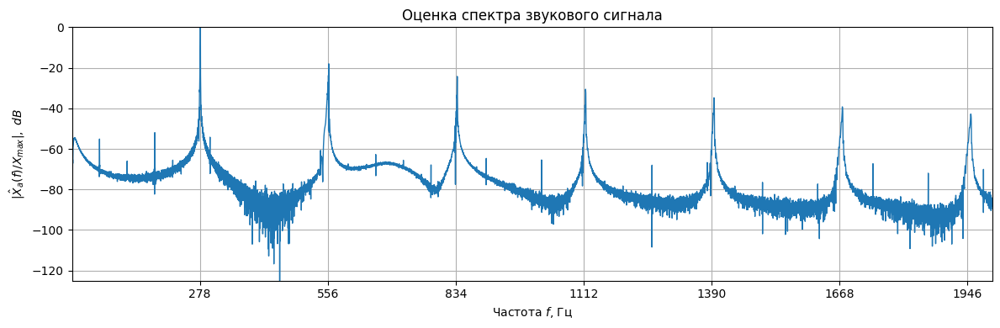

Расстояние между точками: 0.08 Hz


In [2]:
fs, x = scipy.io.wavfile.read('data/guitar.wav')
print("Частота дискретизации %.0f Гц" %fs)
print("Тип данных", x.dtype)
print(f"Число отсчетов записи {x.shape[0]} >= 2^{int(np.log2(x.shape[0]))}")

Nfft=2**19 
if (x.shape[0] <= Nfft):
    newx = np.zeros((Nfft), dtype=x.dtype)
    newx[:x.shape[0]] = x
    x = newx
else:
    x = x[:Nfft]

print(f"FFT size: {Nfft} == 2**{int(np.log2(Nfft))}")
f, Xf = np.linspace(-0.5*fs, 0.5*fs, num=Nfft, endpoint=False), scipy.fft.fftshift(scipy.fft.fft(x/fs, Nfft))

fmax = np.argmax(abs(Xf))
plt.figure(figsize=[12, 4])
plt.title("Оценка спектра звукового сигнала")

Fdb = 20*np.log10(abs(Xf) / abs(Xf[fmax]))

plt.plot(f, Fdb, '-', lw=1)

basef = 278
nharm = 10
ticks = [basef * (i + 1) for i in range(nharm)]
ticksl = [str(t) for t in ticks]

plt.xticks(ticks, ticksl)

plt.xlim(0, 2000)
plt.ylim(-125, 0)
plt.xlabel("Частота $f$, Гц")
plt.ylabel("$|\hat{X}_a(f) / X_{max}|, ~dB$")
plt.tight_layout()
plt.grid()
plt.show()

print("Расстояние между точками: %.2f Hz" % (fs/Nfft))


> Основная гармоника - $f_0 = 278Гц \approx С\#4=277Гц$, До диез первой октавы. Также наблюдаются гармоники $f_n = nf_0$ 

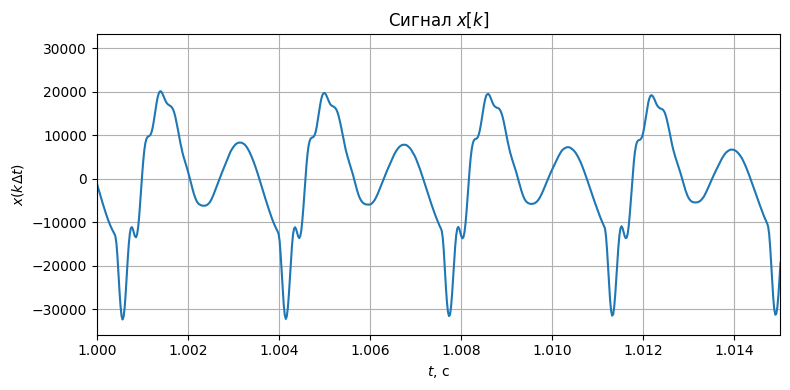

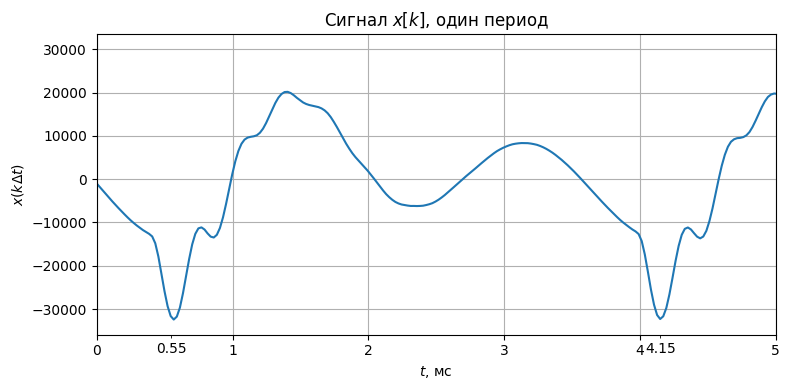

1/T = 278 Hz


In [3]:
plt.figure(figsize=[8, 4]) # размер полотна
plt.plot(np.arange(x.size)/fs, x,) # график сигнала (точками)
plt.grid() # сетка 
plt.xlim([1, 1.015]) # Выделение фраграмента от 1 с до 1,07 с
plt.title("Cигнал $x[k]$") # заголовок графика
plt.xlabel("$t$, c") # подпись оси абсцисс
plt.ylabel("$x(k\Delta t)$") # подпись оси ординат
plt.tight_layout()
plt.show()


t1 = .55
t2 = 4.15

plt.figure(figsize=[8, 4]) # размер полотна
plt.plot(np.arange(x.size)/fs * 1000 - 1000, x,) # график сигнала (точками)
plt.grid() # сетка 
plt.xlim([0, 5]) # Выделение фраграмента от 1 с до 1,07 с
plt.xticks([t1, t2], [str(t1), str(t2)], minor=True)

plt.title("Cигнал $x[k]$, один период") # заголовок графика
plt.xlabel("$t$, мc") # подпись оси абсцисс
plt.ylabel("$x(k\Delta t)$") # подпись оси ординат
plt.tight_layout()
plt.show()

print("1/T = %.0f Hz" % (1000 / (t2 - t1)))

> Частота основной гармоники совпала с $1/T$ исходного сигнала

## Задача 1.2. Задача распознавания спектральных компонент. 

Считайте последовательность $x[k]$ из файла Вашего варианта (`variant_Nv_ex_1_2.npy`, где `Nv` — номер варианта). Известно, что ее аналитическая запись  имеет вид 

$$x[k]=\sum\limits_{m=1}^{M}{{{A}_{m}}}\sin (2\pi \frac{m}{N}k+{{\varphi }_{m}}),\quad k=0,\ 1,\ 2,\ \ldots ,\ N-1,$$


где $N$ — длина последовательности, $M<(N-1)/2$, относительные частоты гармонических компонент совпадают с бинами ДПФ. Определите число компонент,  их амплитуды ${{A}_{m}}$ и фазы ${{\varphi }_{m}}$, $m=1,\dots, M$.


FFT size: 524288 >= 2**19


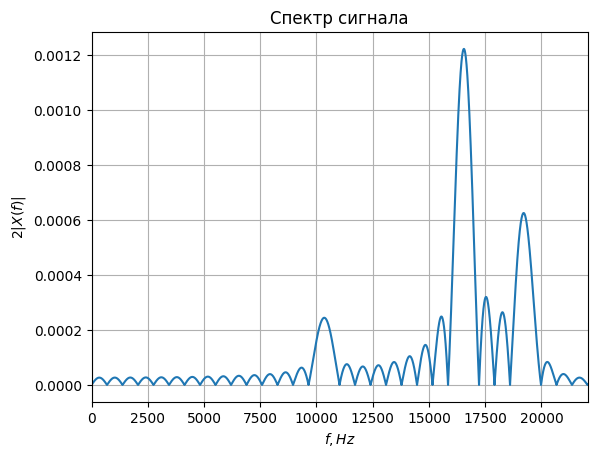

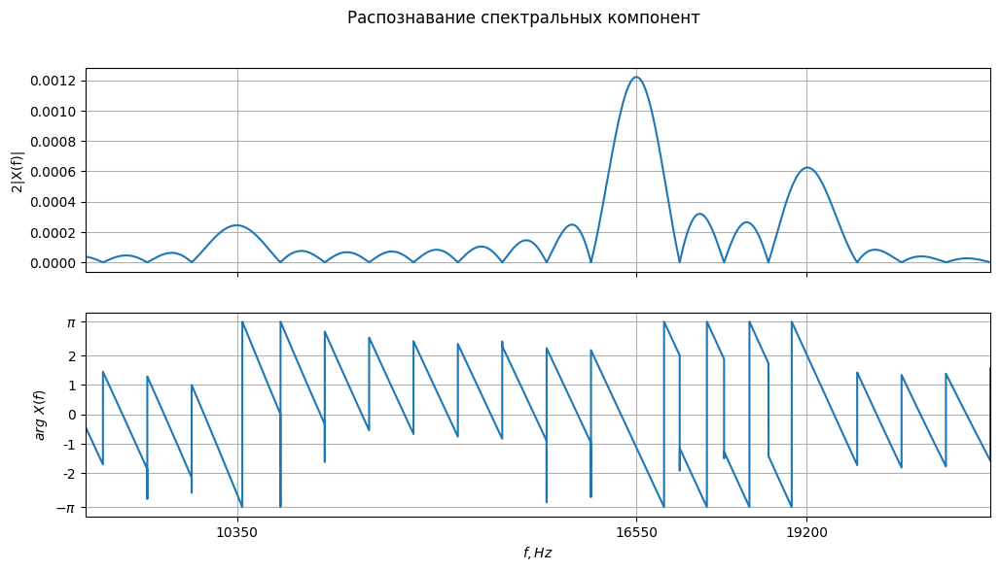

In [4]:
Nv=6
x = np.load('data/variant_%i_ex_1_2.npy' %Nv )
Nfft=max(scipy.fft.next_fast_len(x.size), 2**19) 

print(f"FFT size: {Nfft} >= 2**{int(np.log2(Nfft))}")
f, Xf = np.linspace(0, fs, num=Nfft, endpoint=False), 2 * np.fft.fft(x, Nfft) / Nfft

xlims = [8000, fs/2]

freqs = [10350, 16550, 19200]

plt.plot(f, np.abs(Xf))
plt.xlim(0, fs/2)
plt.grid()
plt.xlabel("$f, Hz$")
plt.ylabel("$2|X(f)|$")
plt.title("Спектр сигнала")

fig, (absplt, argplt) = plt.subplots(2, 1, sharex=True)
fig.set_size_inches(12, 6)

absplt.plot(f, np.abs(Xf))
absplt.set_xticks(freqs, [str(f) for f in freqs])
absplt.set_ylabel("2|X(f)|")
absplt.set_xlim(xlims)

absplt.grid()

argplt.plot(f, np.angle(Xf))
argplt.set_ylabel("$arg ~X(f)$")
argplt.set_yticks([-np.pi, -2, -1, 0, 1, 2, np.pi], ["$-\pi$", "-2", "-1", "0", "1", "2", "$\pi$"])
argplt.set_xlabel("$f, Hz$")
argplt.set_xlim(xlims)
argplt.grid()

plt.suptitle("Распознавание спектральных компонент")

plt.show()

Имеем 3 гармоники, с учетом формул для пересчета:
|  $f_i$, Гц | $A_i, ~10^{-4}$  | $\varphi_i$ |
|:-:         |:-:     |:-:          |
| 10350 | 2.5 | $-\frac{\pi}{2}$ |
| 16550 | 12  | -1 |
| 19200 | 6.5 | 2 |


# Занятие 2. Окна в спектральном анализе.

## Задача 2.1. Исследование характеристик различных окон.
Рассмотрите следующие окна для ДПФ длиной в $N=20+2N_v$, где $N_v $ — номер Вашего варианта:

1) прямоугольное (`boxcar`),

2) Бартлетта (`bartlett`),

3) Ханна (`hann`),

4) Хэмминга (`hamming`),

5) Блэкмана (`blackman`),

6) окно с плоской вершиной (`flattop`).

Постройте графики для окон во временной области, амплитудно-частотной характеристики окон в линейном масштабе и в дБ. По графикам для каждого окна оцените следующие параметры:

* ширину $\Delta \nu$ главного лепестка на уровне половинной мощности,

* максимальный уровень боковых лепестков относительно главного в дБ,

* асимптотическую скорость спада боковых лепестков в дБ/октава. 

Составьте таблицу с результатами. 


|     Окно     | $N\Delta \nu$ | Уровень первого лепестка, дБ | Скорость спада, дБ/окт |
|:------------:|:-:|:-:|:-:|
| boxcar | 0.88 | -13 | -5 |
| bartlett | 1.26 | -26 | -9 |
| hann | 1.43 | -31 | -21 |
| hamming | 1.29 | -43 | -3 |
| blackman | 1.63 | -58 | -20 |
| flattop | 3.69 | -84 | -1 |


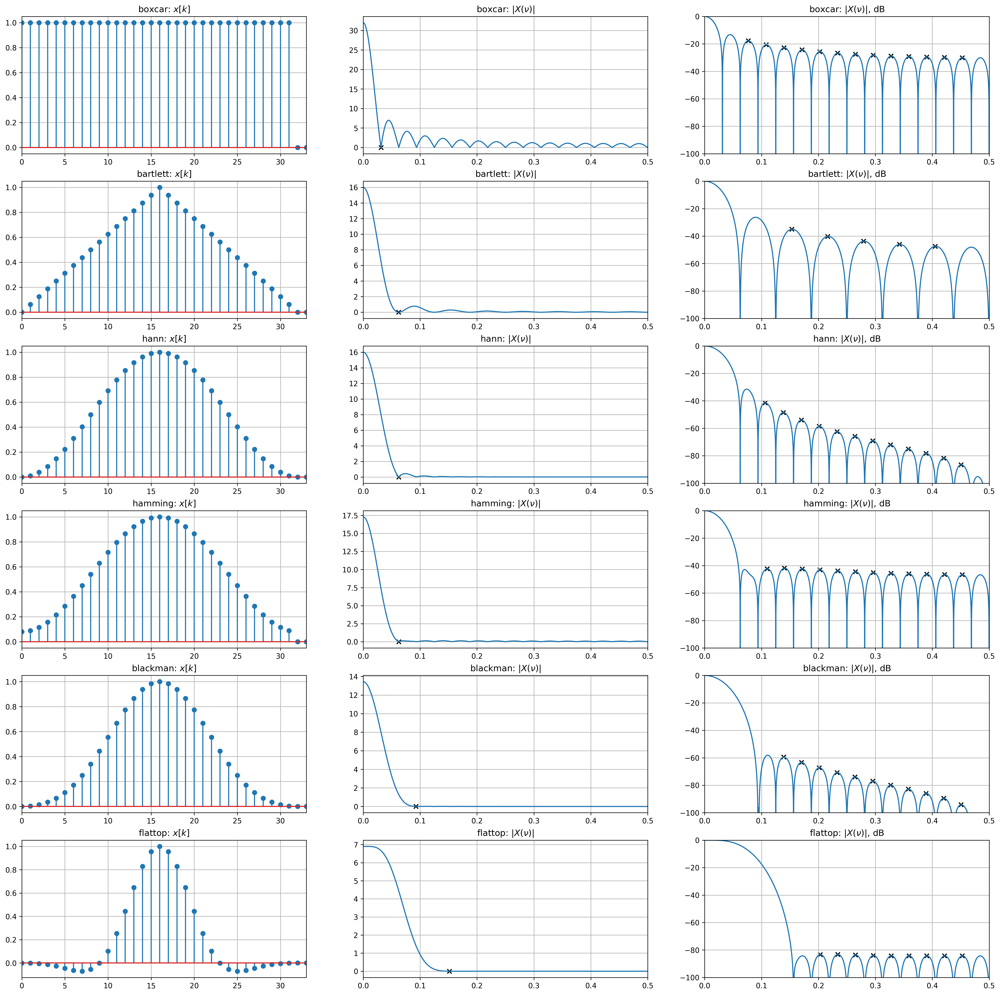

In [5]:
Nvar = 20 + 2*6

def analyze(nus, Wf, Wfdb, wname, N, level):
    eps = 1e-4
    epsdb = 1e-1

    i0 = None
    dnu = None

    extrs = []

    for i in range(1, len(Wf) - 1):
        if dnu is None and np.abs(Wfdb[i] + 3) < epsdb:
            dnu = 2 * nus[i]
        if np.abs(Wf[i] - level) < eps*10:
            i0 = i
            break
    
    zero = i0
    while i0 < len(Wf) // 2:
        for i in range(i0 + 2, len(Wf) // 2):
            if np.abs((Wf[i+1] - Wf[i]) / Wf[i]) < eps*10 and ((Wf[i+1] - 2*Wf[i] + Wf[i - 1]) / Wf[i]) < eps*0.5:
                if len(extrs) == 0 or np.abs(nus[i0] - nus[i]) > 1e-2:
                    extrs.append(i)
                i0 = i
                break
        i0 += 1

    e0 = extrs[0]
    extrs = extrs[1:-1]

    ntofit = np.log2(nus[extrs]/ nus[extrs[0]])
    k, b = np.polyfit(ntofit, Wfdb[extrs], 1)

    out = wname, round(dnu * N, 2), round(Wfdb[e0]), round(k) 

    return zero, extrs, out

def plot_window(tfig, ffig_lin, ffig_db, wname, N, padding=0, level=0):
    k = np.arange(N+padding)
    W = np.zeros(N+padding, dtype=np.float64)
    W[:N] = signal.get_window(wname, N)
    
    Wf  = np.abs(np.fft.fft(W))

    Wfdb = 20*np.log10(Wf/Wf[0] + 1e-7)
    nu = k / (N + padding)

    tfig.stem(k, W)
    ffig_lin.plot(nu, Wf)
    ffig_db.plot(nu, Wfdb)

    tfig.set_xlim(0, N + 1)
    ffig_lin.set_xlim(0, .5)
    #ffig_lin.set_xlim(0.02, .1)
    #ffig_lin.set_ylim(0.05, .1)
    
    ffig_db.set_xlim(0, .5)
    ffig_db.set_ylim(-100, 0)

    tfig.grid()
    ffig_lin.grid()
    ffig_db.grid()

    tfig.set_title(f"{wname}: $x[k]$")
    ffig_lin.set_title(f"{wname}: $|X(\\nu)|$")
    ffig_db.set_title(f"{wname}: $|X(\\nu)|$, dB")

    i0, extrs, out = analyze(nu, Wf, Wfdb, wname, N, level)

    ffig_lin.scatter(nu[i0], Wf[i0], color="k", marker="x")
    ffig_db.scatter(nu[extrs], Wfdb[extrs], color="k", marker="x")

    return out

def gen_md(lines):
    from IPython.display import display, Markdown
    md = "|     Окно     | $N\Delta \\nu$ | Уровень первого лепестка, дБ | Скорость спада, дБ/окт |\n|:------------:|:-:|:-:|:-:|\n"

    for line in lines:
        md += "| %s | %.2f | %d | %d |\n" % line

    display(Markdown(md))

windows = ["boxcar", "bartlett", "hann", "hamming", "blackman", "flattop"]

fig, subplots = plt.subplots(len(windows), 3)
fig.set_size_inches(24, 24)
fig.set_dpi(300)

lines = []
for figs, wname in zip(subplots, windows):
    line = plot_window(*figs, wname, Nvar, 4096, 0)
    lines.append(line)

gen_md(lines)

## Задача 2.2. Окно Кайзера.
Повторите вычисления задачи 2.1 для окна Кайзера с параметром $\beta =0;\ \ 5;\ \ 6;\ \ 8,6$. Сравните полученные результаты с предыдущей задачей. 


|     Окно     | $N\Delta \nu$ | Уровень первого лепестка, дБ | Скорость спада, дБ/окт |
|:------------:|:-:|:-:|:-:|
| ('kaiser', 0.0) | 0.87 | -13 | -5 |
| ('kaiser', 5.0) | 1.28 | -37 | -5 |
| ('kaiser', 6.0) | 1.39 | -44 | -6 |
| ('kaiser', 8.6) | 1.61 | -64 | -6 |


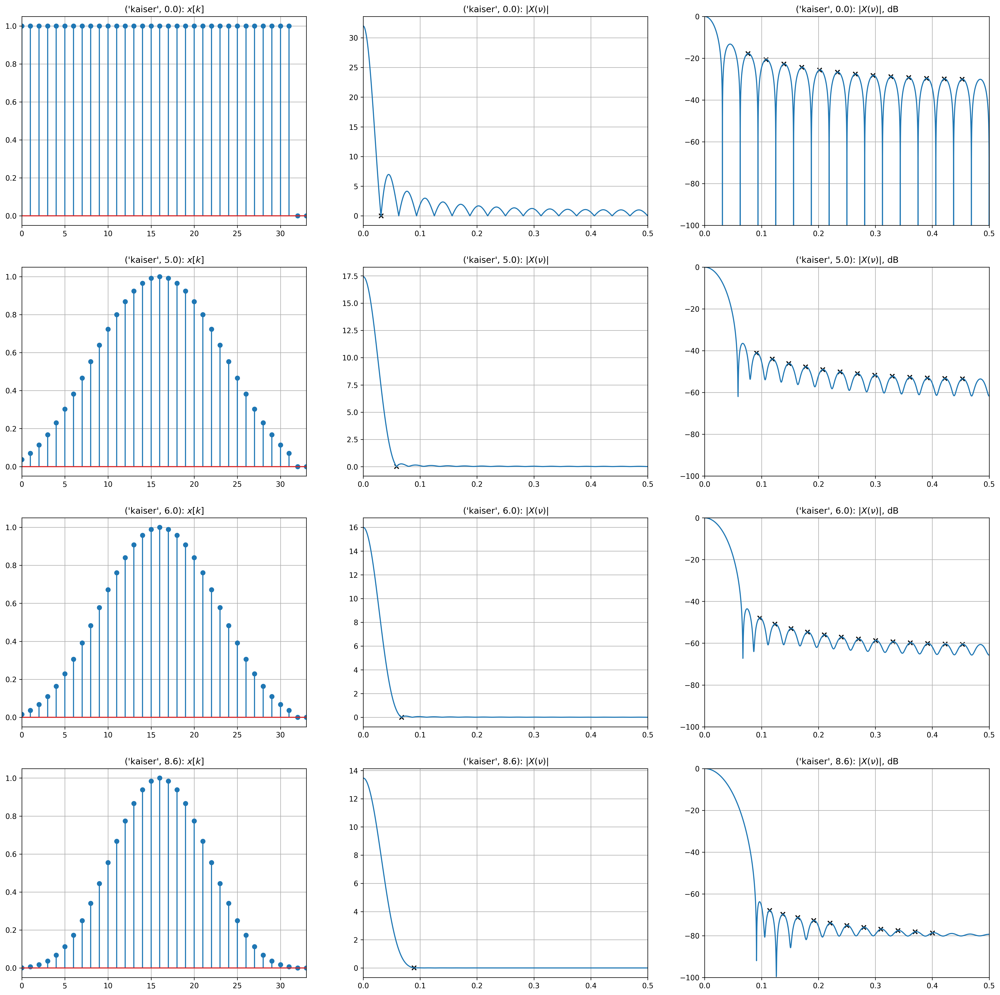

In [6]:
windows = [("kaiser", 0.0), ("kaiser", 5.0), ("kaiser", 6.0), ("kaiser", 8.6)]
levels = [0, 0.015, 0.0099, 0.008]

fig, subplots = plt.subplots(len(windows), 3)
fig.set_size_inches(24, 24)
fig.set_dpi(300)

lines = []
kaiser_levels = []
for figs, wname, level in zip(subplots, windows, levels):
    line = plot_window(*figs, wname, Nvar, 8192, level)
    lines.append(line)
    kaiser_levels.append(line[-2])

gen_md(lines)

## Задача 2.3. Окно Чебышева.
Получите окно Чебышева для четырех уровней боковых лепестков, которые получились в задаче 2.2. Сравните ширину главного лепестка на уровне половинной мощности с результатами предыдущих задач. 


[('chebwin', 13), ('chebwin', 37), ('chebwin', 44), ('chebwin', 64)]


C:\Users\Vladimir\AppData\Roaming\Python\Python39\site-packages\scipy\signal\windows\_windows.py:2374: UserWarning: This window is not suitable for spectral analysis for attenuation values lower than about 45dB because the equivalent noise bandwidth of a Chebyshev window does not grow monotonically with increasing sidelobe attenuation when the attenuation is smaller than about 45 dB.
  return winfunc(*params, sym=sym)


|     Окно     | $N\Delta \nu$ | Уровень первого лепестка, дБ | Скорость спада, дБ/окт |
|:------------:|:-:|:-:|:-:|
| ('chebwin', 13) | 0.85 | -14 | -1 |
| ('chebwin', 37) | 1.16 | -32 | -2 |
| ('chebwin', 44) | 1.25 | -39 | -2 |
| ('chebwin', 64) | 1.46 | -57 | -3 |


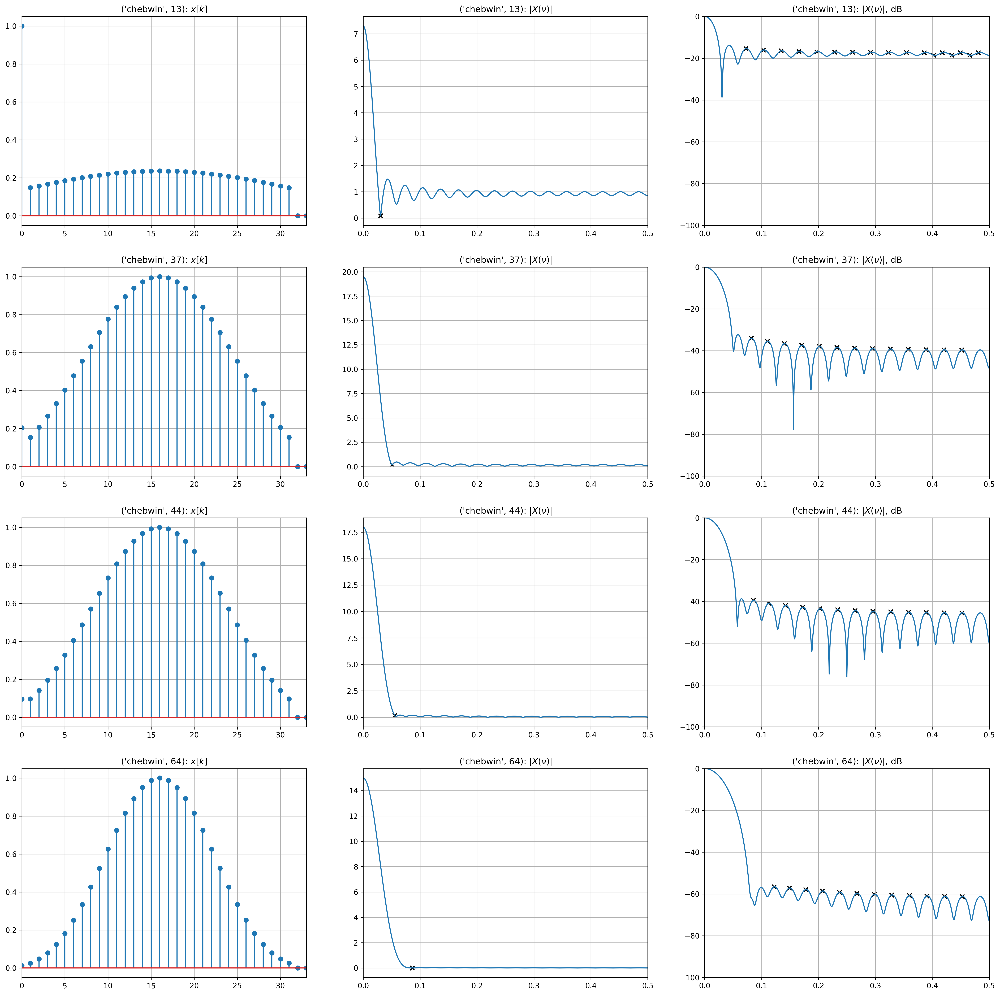

In [7]:
windows = [("chebwin", -lv) for lv in kaiser_levels]
print(windows)
levels = [0.085, 0.19, 0.18, 0.008]

fig, subplots = plt.subplots(len(windows), 3)
fig.set_size_inches(24, 24)
fig.set_dpi(300)

lines = []
for figs, wname, level in zip(subplots, windows, levels):
    line = plot_window(*figs, wname, Nvar, 8192, level)
    lines.append(line)

gen_md(lines)

## Задача 2.4. Различимость спектральных компонент.

| Варианты: | 1 | 2 | 3 | 4 | 5 | 6 | 7 | 8 | 9 | 10 | 11 | 12 |
|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|
|$n_0$|11 | 15 | 18 | 17 | 32 | 48 | 15 | 18 | 47 | 32 | 40 | 38 |
|$\beta_0$| 1.1| 1.5 | 1.2 | 1.5 | 1.1 | 1.3 | 1.1 | 1.4 | 1.5 | 1.3 | 1.2 | 1.1 |
|$\beta_1$| 5 | 5.5 | 6.2 | 5.7 | 6.1 | 4.9 | 5.1 | 5.7 | 6 | 5.8 | 5.7 | 5.5 |

Произведите спектральный анализ с помощью ДПФ размерности $M=2048$ последовательности 
$$x[k]=\cos\left(2\pi \dfrac{n_0}{128} k\right)+ \cos\left(2\pi \dfrac{n_0+2}{128} k\right)$$
 со взвешиванием следующими оконными функциями длиной 128 отчетов:
 
 а) окном Кайзера с параметром $\beta=\beta_0.$,

 б) окном Кайзера с параметром $\beta=\beta_1.$
 
 в) окном Блэкмана.
 
Значения параметров $n_0$ и $\beta=\beta_1$ определите из таблицы. Ответьте на следующие вопросы.
 
1) Для каких оконных функций гармонические компоненты оказались различимы и почему?

2) Как влияет максимальный уровень боковых лепестков оконной функции на результат спектрального анализа? 


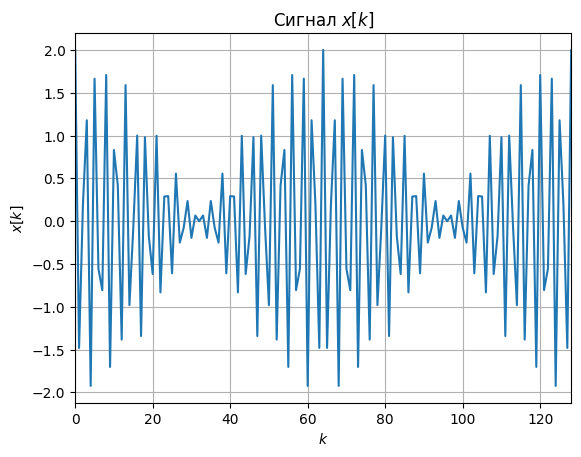

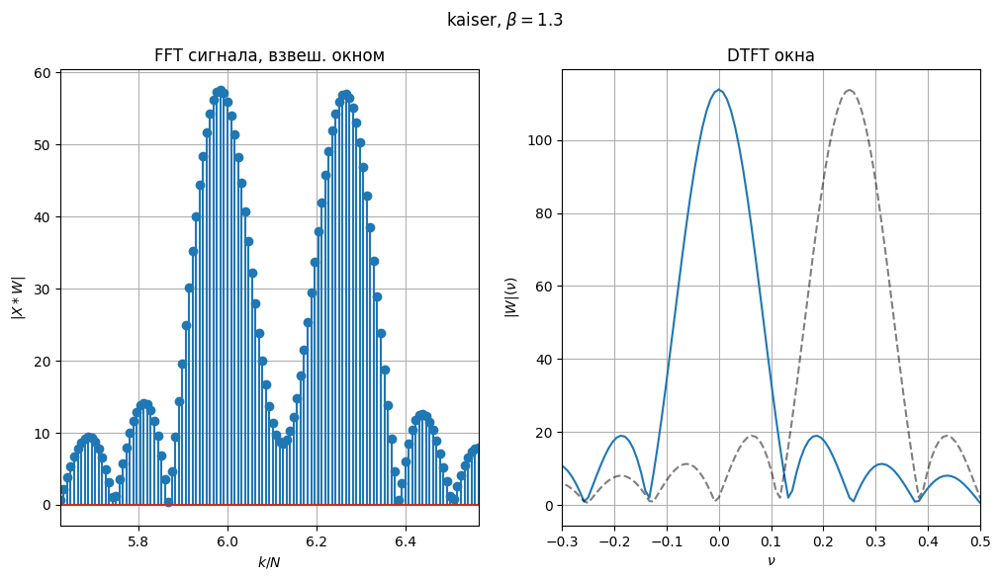

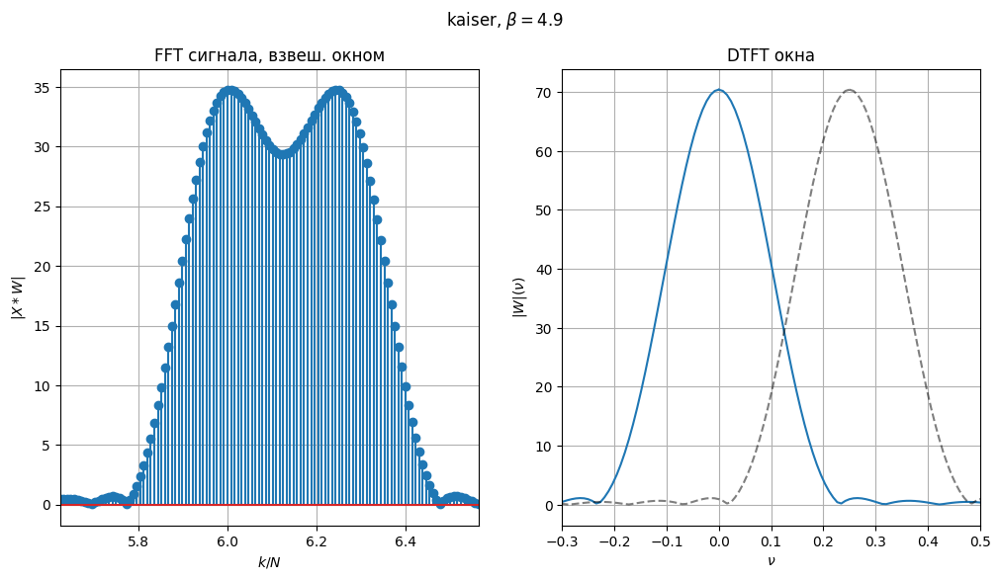

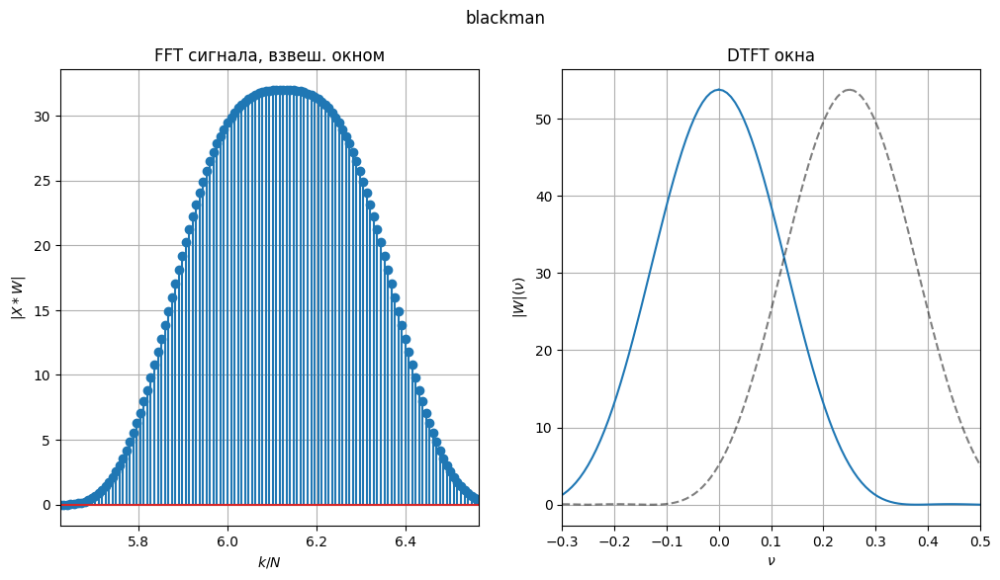

In [8]:
n0 = 48
b0 = 1.3
b1 = 4.9
M = 2048
N = 128

k = np.arange(0, M)
x = np.cos(2 * np.pi * n0 * k / 128) + np.cos(2 * np.pi * (n0 + 2) * k / 128)

plt.plot(k, x)
plt.xlim(0, 128)
plt.title("Сигнал $x[k]$")
plt.ylabel("$x[k]$")
plt.xlabel("$k$")
plt.grid()
plt.show()

wk0 = signal.get_window(("kaiser", b0), M)
wk1 = signal.get_window(("kaiser", b1), M)
wbm = signal.get_window("blackman", M)

def analyze(window, title):
    w = np.zeros_like(x)
    w[:N] = signal.get_window(window, N)
    Xw = np.fft.fft(x * w, M)

    fig, (xplt, wplt) = plt.subplots(1, 2)
    fig.set_size_inches(12, 6)

    xplt.stem(k / N, np.abs(Xw))
    xplt.set_xlim(720 / N, 840 / N)

    xplt.set_ylabel("$|X * W|$")
    xplt.set_xlabel("$k/N$")
    xplt.set_title(f"FFT сигнала, взвеш. окном")
    xplt.grid()

    W = np.abs(np.fft.fft(w, M))
    
    wplt.plot(k / N, W, "C0-")
    wplt.plot(-k / N, W, "C0-")
    wplt.plot(0.25 - k/N, W, "k--", alpha=0.5)
    wplt.plot(0.25 + k/N, W, "k--", alpha=0.5)

    wplt.set_xlim(-.3, .5)
    wplt.set_title(f"DTFT окна")
    wplt.grid()
    wplt.set_xlabel("$\\nu$")
    wplt.set_ylabel("$|W|(\\nu)$")

    plt.suptitle(title)

analyze(("kaiser", b0), f"kaiser, $\\beta={b0}$")
analyze(("kaiser", b1), f"kaiser, $\\beta={b1}$")
analyze("blackman", "blackman")

> Графики представлены в единицах длины окна, то есть $k / N$. Расстояние между гармониками $32 / 128 = 0.25$ в данных единицах. При этом, разные окна имеют разную ширину основного купола. При наложении спектров окон друг на друга основные гармоники перестают быть различимыми. <br><br>
Максимальный уровень боковых лепестков влияет на разрешимость слабых соседних гармоник

## Задача 2.5. Маскировка слабой гармоники боковыми лепестками окна.


| Варианты: |       1      |     2     |         3        |      4     |        5        |        6       |
|:---------:|:------------:|:---------:|:----------------:|:----------:|:---------------:|:--------------:|
| $w_1[k]$ | Бартлетта | Ханна | Хэмминга | Ханна | Бартлетта | Хэмминга |
| $m_2$ |    -2     |     2    |   -2    |     2    |   -2    |     2    |
| $m_3$ |     4     |     6    |    3    |     4    |    5    |     7    |


| Варианты: |       7      |     8     |         9        |      10     |        11       |        12       |
|:---------:|:------------:|:---------:|:----------------:|:----------:|:---------------:|:--------------:|
| $w_1[k]$ | Хэмминга | Ханна | Бартлетта | Ханна | Хэмминга | Бартлетта |
| $m_2$ |      2     |   -2    |     2    |   -2    |     2    |   -2    |
| $m_3$ |      7     |    3    |    -3    |   -4    |     5    |    4    |

Сгенерировать последовательность отсчетов гармонического сигнала $x[k]$ длительностью $N=64$, которая может быть описана следующей формулой:
$$x[k]=a_1 \sin\left(2\pi k \frac{n}{N}\right) + a_2 \cos\left(2\pi k \frac{n+m_2}{N}\right) - a_3\sin\left(2\pi k \frac{n+m_3}{N}\right),$$
где $a_1 = n = n_\text{v}+10$ ($n_\text{v}$ — номер вашего варианта), $a_2 = \dfrac{a_1}{6}$, $a_3 = \dfrac{a_1}{2}$, $m_2$  и  $m_3$  значения из таблицы, соответствующие вашему варианту.

* Построить ДВПФ $x[k]$, применив прямоугольное окно. Сколько гармонических компонент можно выделить?

* Построить ДВПФ $x[k]$, применив окно Блэкмана. Какие гармонические компоненты наблюдаются теперь?

* Построить ДВПФ $x[k]$, используя окно $w_1[k]$ из вашего варианта. Получилось ли пронаблюдать все гармонические компоненты?

* Подобрать коэффициенты для окон Чебышева и Кайзера так, чтобы возможно было наблюдать все гармонические компоненты. Построить соответствующие графики.

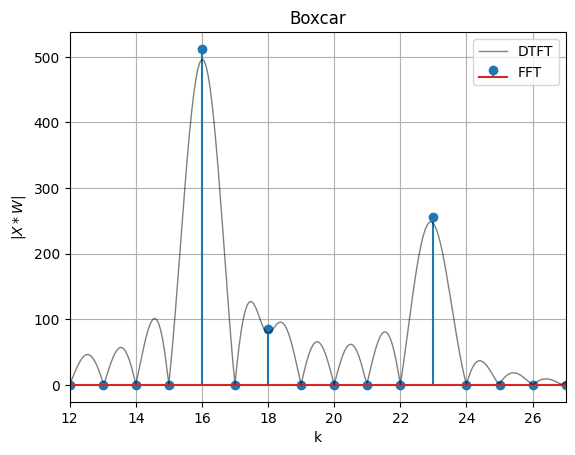

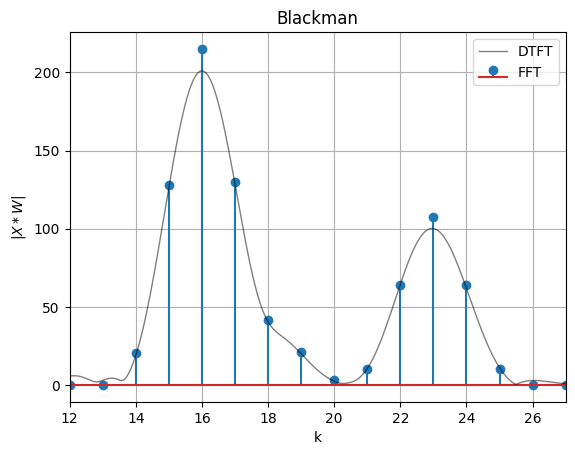

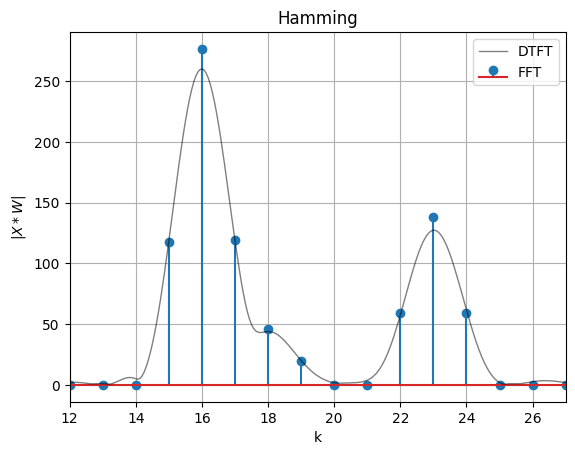

16 18 23


In [14]:
m2 = 2
m3 = 7
nv = 6
N = 64

n = nv + 10
a1 = n
a2 = a1 / 6
a3 = a1 / 2

k = np.arange(N)
kn = 2 * np.pi * k / N

x = a1 * np.sin(kn * n) + a2 * np.cos(kn * (n + m2)) - a3 * np.sin(kn * (n + m3))

def analyze(window, title, padding=1024):
    kp = np.arange(padding)
    w = signal.get_window(window, N)
    
    Xw = np.fft.fft(x * w)

    xw_padded = np.zeros_like(kp)
    xw_padded[:N] = x * w

    Xw_padded = np.fft.fft(xw_padded)
    plt.stem(k, np.abs(Xw), label="FFT")
    plt.plot(kp * N / padding, np.abs(Xw_padded), "k-", label="DTFT", alpha=0.5, lw=1)
    plt.legend()
    plt.title(title)
    plt.grid()

    plt.xlim(n - 4, n + m3 + 4)

    plt.xlabel("k")
    plt.ylabel("$|X * W|$")

    plt.show()

analyze("boxcar", "Boxcar")
analyze("blackman", "Blackman")
analyze("hamming", "Hamming")

print(n, n + m2, n + m3)

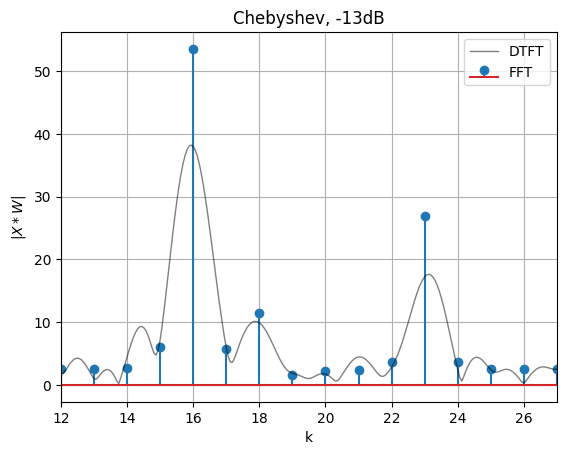

In [10]:
analyze(("chebwin", 13), "Chebyshev, -13dB")

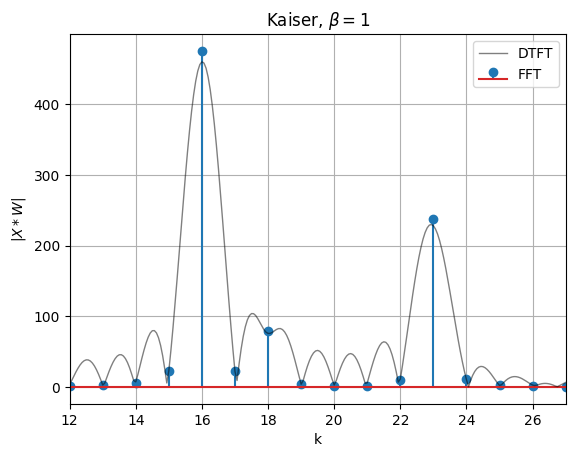

In [18]:
analyze(("kaiser", 1), "Kaiser, $\\beta=1$")

## Задача 2.6. Амплитудная модуляция спектра.

| Варианты: | 1 | 2 | 3 | 4 | 5 | 6 | 7 | 8 | 9 | 10 | 11 | 12 |
|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|
|$n_0$|11,5 | 15,5 | 18,5 | 17,5 | 32,5 | 48,5 | 15,5 | 18,5 | 47,5 | 32,5 | 40,5 | 38,5 |

Произведите спектральный анализ с помощью ДПФ размерности $M=128$ последовательности 
$$x[k]=\cos\left(2\pi \dfrac{n_0}{128} k\right)$$
 со взвешиванием следующими оконными функциями длиной 128 отчетов:
 
 а) прямоугольным окном (`boxcar`),

 б) окном с плоской вершиной (`flattop`).
 
 
Значение параметра $n_0$ определите из таблицы. Отнормируйте ДПФ на значение АЧХ оконной функции на нулевой частоте ($W(0)=\sum_{k=0}^{N-1} w[k]$). Для двух окон сравните амплитуду гармоники с модулем ближайших к ней отсчетов ДПФ.

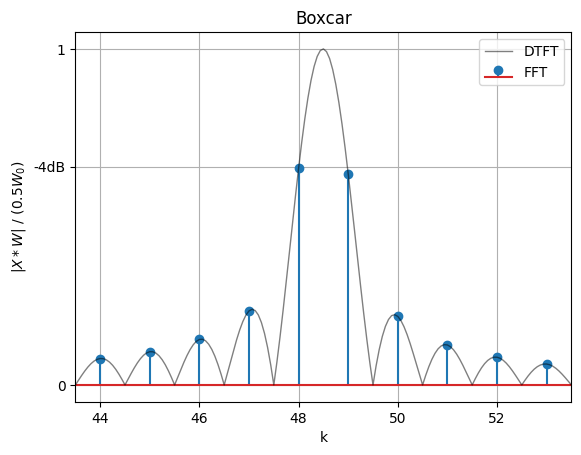

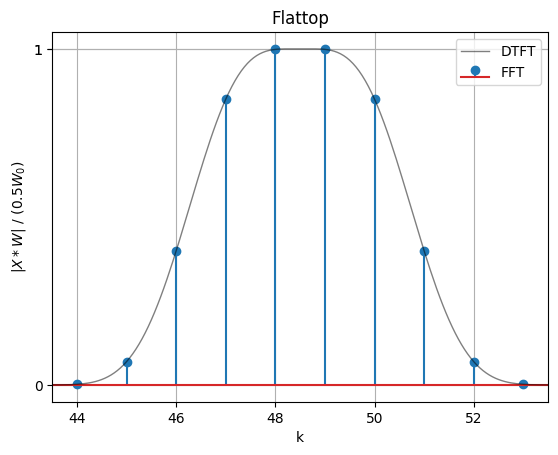

In [19]:
M = 128
n0 = 48.5

k = np.arange(M)
x = np.cos(2 * np.pi * n0 * k / 128)

def analyze(window, title, lvl, padding=2048):
    w = signal.get_window(window, M)
    W0 = np.sum(w)

    xw = x * w

    Xw = np.abs(np.fft.fft(xw))

    plt.stem(k, 2 * Xw / W0, label="FFT")

    kp = np.arange(padding)
    xwp = np.zeros_like(kp, dtype=np.float64)
    xwp[:M] = xw

    Xwp = np.abs(np.fft.fft(xwp))

    plt.plot(kp * M / padding, 2 * Xwp / W0, "k-", alpha=0.5, lw=1, label="DTFT")
    plt.xlim(n0-5, n0+5)
    
    plt.title(f"{title}")
    plt.xlabel("k")
    plt.ylabel("$|X * W| ~/~ (0.5W_0)$")

    lvldb = 20 * np.log10(lvl)

    plt.yticks([0, lvl, 1], ["0", str(int(round(lvldb, 0))) + "dB", "1"])
    plt.grid()
    plt.legend()
    plt.show()

analyze("boxcar", "Boxcar", 0.65)
analyze("flattop", "Flattop", 1)

# Занятие 3. Кратковременное дискретное преобразование Фурье (STFT) 

## Задача 3.1. Спектрограмма аудиофайла.  

| Варианты: |       1      |     2     |         3        |      4     |        5        |        6       |
|:---------:|:------------:|:---------:|:----------------:|:----------:|:---------------:|:--------------:|
| **Имя файла** |'clarinet_minor.wav' | 'clarinet_major32.wav'| 'major_scale_flute1.wav' | 'major_scale_flute2.wav'|'major_scale_flute3.wav' | 'major_scale_flute4.wav'|

| Варианты: |       7      |     8     |         9        |      10     |        11        |        12       |
|:---------:|:------------:|:---------:|:----------------:|:----------:|:---------------:|:--------------:|
| **Имя файла** |'major_scale_flute5.wav'|'major_scale_piano2.wav'|'major_scale_piano3.wav'|'single_notes.wav'|'violin_natural_minor.wav'|'violin_natural_minor_up.wav'|


Вычислите кратковременное дискретное преобразование Фурье (STFT) для отсчетов сигнала, содержащихся в аудиофайле Вашего варианта. Изобразите спектрограмму сигнала. Длину окна (размер кадра), тип оконной функции, число точек в перекрытии, масштабы осей и размерность ДПФ самостоятельно подберите так, чтобы можно было выделить гармонические компоненты в сигнале. Ответьте на следующие вопросы.

1) Какие выводы можно сделать о составе данного сигнала по спектрограмме?  

2) Чему равен размер кадра в секундах и как это соотносится с графиком?

3) Какое разрешение по времени и какое по частоте у данной спектрограммы? 

4) Какие изменения можно наблюдать в спектрограмме, если изменяется:

* а) тип оконной функции,

* б) длина окна,

* в) размерность ДПФ (за счет дополнения нулевыми отсчетами)?


In [28]:
from IPython.display import Audio

path = "data/major_scale_flute4.wav"

fs, x = scipy.io.wavfile.read(path)
print(fs)
Audio(path)


44100


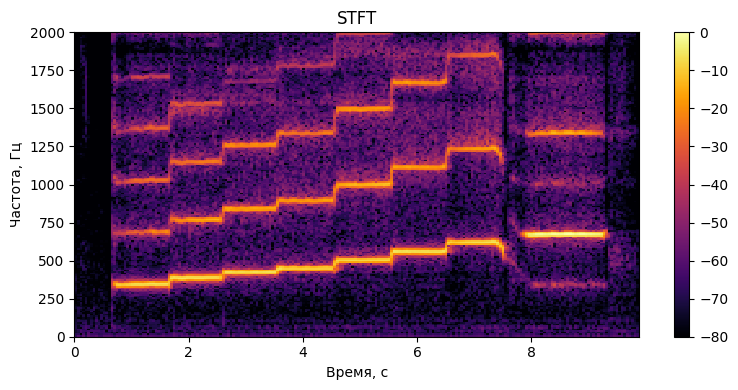

In [34]:
plt.figure(figsize=[8, 4], dpi=100)
f, t, Zxx = signal.stft(x, fs=fs, window=('hann'), nperseg=4000, noverlap=2000, nfft=2**12)
plt.pcolormesh(t, f,  20*np.log10(np.abs(Zxx[:-1, :-1])/np.max(abs(Zxx))), vmin=-80, cmap=plt.get_cmap('inferno'), shading='flat')
plt.colorbar()
plt.ylim((0, 2000))
plt.title('STFT')
plt.ylabel('Частота, Гц')
plt.xlabel('Время, с')
plt.tight_layout()

Имеем восходящую последовательность частот (мажорный лад с сомнительным интонированием)

Длительность кадра - это длина окна во времени, то есть $M / f_s = 4000 / 44100 \approx 0.1с $


Разрешение по времени по определению $R / f_s = (M - L) / f_s = (4000 - 2000) / 44100 \approx 0.05c$. На графике в одной секунде примерно 20 отсчетов, что похоже на правду.

Разрешение по частоте оценим через разрешение DFT $f_s / N_{FFT} = 44100 / 2^{12} \approx 10Гц$. На графике примерно 9 отсч / 100 Гц, похоже на правду.

### Измение типа окна

Изменим окно на прямоугольно ради прикола

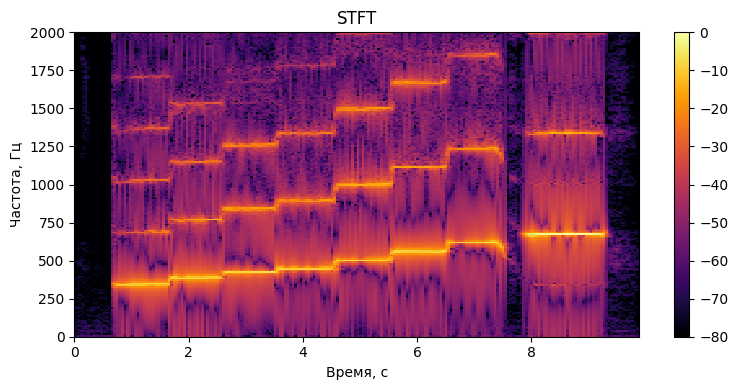

In [35]:
plt.figure(figsize=[8, 4], dpi=100)
f, t, Zxx = signal.stft(x, fs=fs, window=('boxcar'), nperseg=4000, noverlap=2000, nfft=2**12)
plt.pcolormesh(t, f,  20*np.log10(np.abs(Zxx[:-1, :-1])/np.max(abs(Zxx))), vmin=-80, cmap=plt.get_cmap('inferno'), shading='flat')
plt.colorbar()
plt.ylim((0, 2000))
plt.title('STFT')
plt.ylabel('Частота, Гц')
plt.xlabel('Время, с')
plt.tight_layout()

> Видим, что низкая скорость затухания боковых лепестков приводит к размытию по оси частот. Однако, основные пики стали четче, что соотвествует отоносительно небольшой ширине основного лепестка прямоугольного окна

### Изменение длины окна

Вернем окно Ханна и уменьшим его длину и overlap. Мы должны увидеть улучшение разрешения по времени, но при этом увидеть расширения основного и побочных пиков на чатотной оси

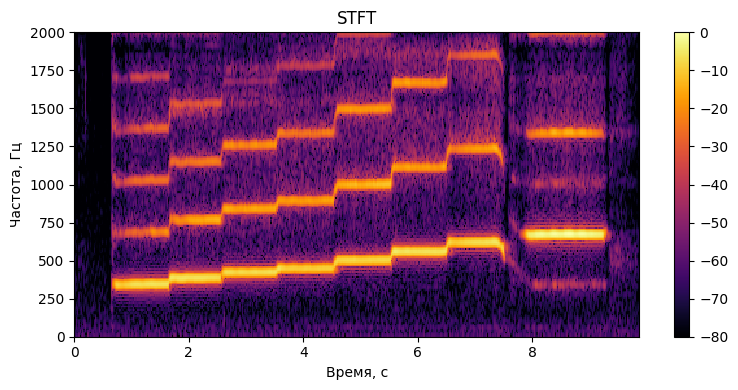

In [37]:
plt.figure(figsize=[8, 4], dpi=100)
f, t, Zxx = signal.stft(x, fs=fs, window=('hann'), nperseg=2000, noverlap=1000, nfft=2**12)
plt.pcolormesh(t, f,  20*np.log10(np.abs(Zxx[:-1, :-1])/np.max(abs(Zxx))), vmin=-80, cmap=plt.get_cmap('inferno'), shading='flat')
plt.colorbar()
plt.ylim((0, 2000))
plt.title('STFT')
plt.ylabel('Частота, Гц')
plt.xlabel('Время, с')
plt.tight_layout()

### Изменение размерности ДПФ
Мы должны увидеть улучшение разрешения по частоте.

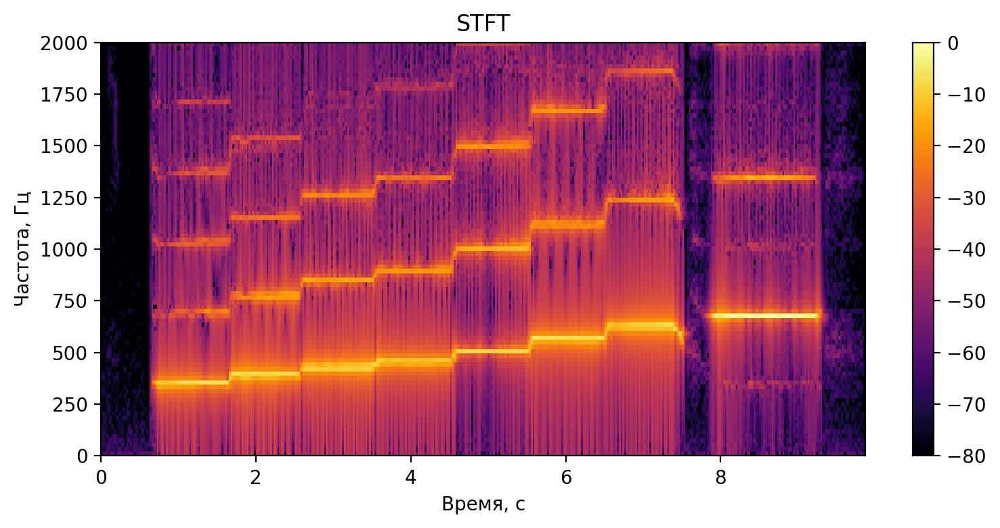

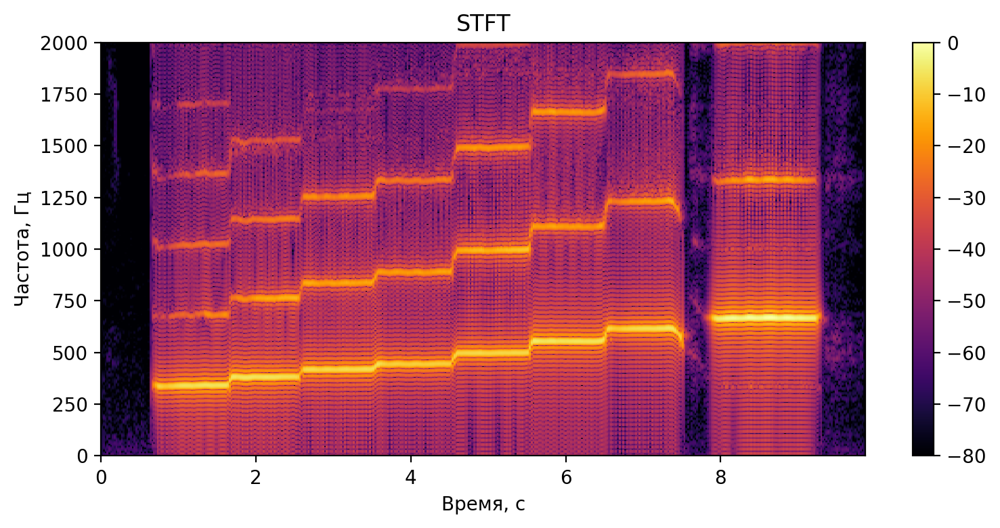

In [ ]:
cmap="inferno"

plt.figure(figsize=[8, 4], dpi=200)
f, t, Zxx = signal.stft(x, fs=fs, window=('boxcar'), nperseg=2048, noverlap=1024, nfft=2**11)
plt.pcolormesh(t, f,  20*np.log10(np.abs(Zxx[:-1, :-1])/np.max(abs(Zxx))), vmin=-80, cmap=plt.get_cmap(cmap), shading='flat')
plt.colorbar()
plt.ylim((0, 2000))
plt.title('STFT')
plt.ylabel('Частота, Гц')
plt.xlabel('Время, с')
plt.tight_layout()
plt.show()

plt.figure(figsize=[8, 4], dpi=200)
f, t, Zxx = signal.stft(x, fs=fs, window=('boxcar'), nperseg=2048, noverlap=1024, nfft=2**16)
plt.pcolormesh(t, f,  20*np.log10(np.abs(Zxx[:-1, :-1])/np.max(abs(Zxx))), vmin=-80, cmap=plt.get_cmap(cmap), shading='flat')
plt.colorbar()
plt.ylim((0, 2000))
plt.title('STFT')
plt.ylabel('Частота, Гц')
plt.xlabel('Время, с')
plt.tight_layout()

## Задача 3.2. Спектрограмма ЛЧМ сигнала. 

| Варианты: | 1 | 2 | 3 | 4 | 5 | 6 | 7 | 8 | 9 | 10 | 11 | 12 |
|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|
|$f_0$, Гц | 170| 80 | 90 | 75 | 120 | 130 | 85 | 95 | 70 | 65 | 110 | 105 |
|$f_1$, Гц | 800 | 900 | 850 | 870 | 820 | 875 | 780 | 810 | 790 | 825 | 830 | 840 |

Постройте спектрограмму c окном Блэкмана для ЛЧМ-сигнала длительностью $T=2$ секундам, мгновенная частота которого изменяется от $f_0$ до $f_1$, частота дискретизации $f_s=2000$ Гц. Начальный размер кадра (`nperseg`) выберите $H=512$ отсчетов. Пронаблюдайте, как изменяется спектрограмма при изменении следующих параметров:
* тип оконной функции (`window`),
* длина кадра (`nperseg`),
* размерность ДПФ (`nfft`).

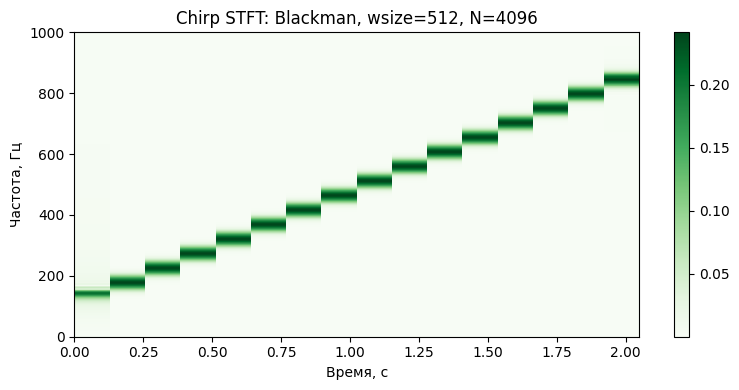

In [74]:
fs = 2000
T = 2

f0 = 130
f1 = 875

t = np.linspace(0, T, T*fs)
x = signal.chirp(t, f0, T, f1)

N0 = 512

def analyze(window, wname, nperseg, nfft):
    plt.figure(figsize=[8, 4], dpi=100)
    f, t, Zxx = signal.stft(x, fs=fs, window=(window), nperseg=nperseg, nfft=nfft)
    plt.pcolormesh(t, f,  np.abs(Zxx[:-1, :-1]), cmap=plt.get_cmap("Greens"), shading='flat')
    plt.colorbar()
    plt.ylim((0, 1000))
    plt.title(f'Chirp STFT: {wname}, wsize={nperseg}, N={nfft}')
    plt.ylabel('Частота, Гц')
    plt.xlabel('Время, с')
    plt.tight_layout()
    plt.show()

analyze("blackman", "Blackman", N0, 8*N0)

### Изменение типа окна

Поменяем окно на прямоугольное. Должны увидеть более четкие пики, а также побочные лепестки

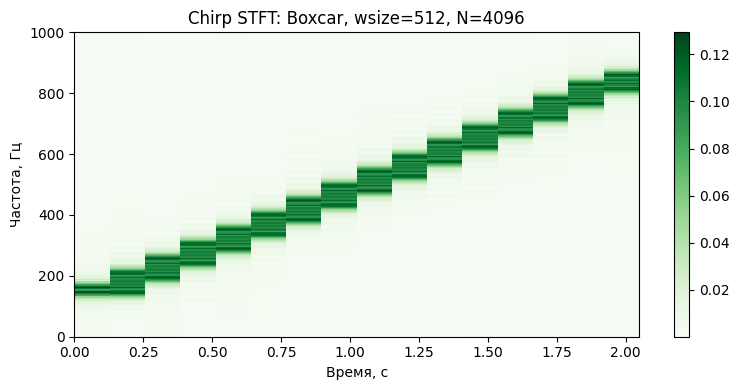

In [76]:
analyze("boxcar", "Boxcar", N0, 8*N0)

### Изменение длины кадра (размера окна)

Вернем окно Блэкмана и уменьшим размер окна. Увидим улучшение разрешения по времени.

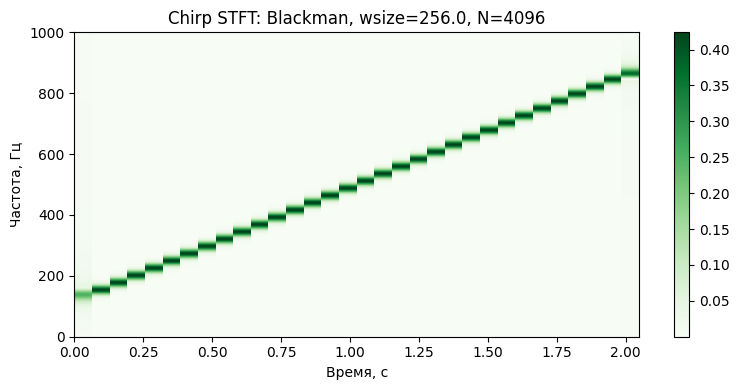

In [81]:
analyze("blackman", "Blackman", N0/2, 8*N0)

# Примеры вычислений на Python для лабораторной работы №3

## Обработка wav-файла 

Чтение звукового wav-файла можно провести с помощью функции `scipy.io.wavfile.read`. На вход она принимает первым параметром (и единственным обязательным) адрес файла, который требуется декодировать. Функция возвращает частоту дискретизации в Гц (`fs`) и (`x`) - массив отсчетов. В случае монозаписи (одноканальной) массив `x` одномерный, а у случае стереозаписи (двуканальной) —  двумерный, где номера строк соответствуют разным каналам записи, а номера столбцов – индексам отсчетов. 

Цифровой сигнал является одновременно и дискретизованным по времени, и квантованным по уровню. Поэтому каждый отсчет кодируется заданным числом бит, определяемым типом данных для элементов массива `x`. Например, для `int16` один отсчет занимает 16 бит (16 двоичных разрядов), а число уровней квантования $2^{16}$. 

In [12]:
import scipy.io.wavfile
import numpy as np
fs, x = scipy.io.wavfile.read('cello4.wav')
print("Частота дискретизации %.0f Гц" %fs)
print("Тип данных", x.dtype)
print("Размер массива", x.shape)
print("Число отсчетов записи", x.shape[0])

FileNotFoundError: [Errno 2] No such file or directory: 'cello4.wav'

Воспроизведем звукозапись. 

In [ ]:
from IPython.display import Audio
Audio('./cello4.wav')

Если запись двуканальная, возьмем в рассмотрение только один канал.

In [ ]:
if len(x.shape)==2:
    x=x[:, 0]

Построим график сигнала во временной области. Для выделения фрагмента можно использовать функцию `plt.xlim` или инструменты zoom и pan (при backend notebook). Для использования zoom нужно выделить прямоугольником область графика, которую требуется рассмотреть. Для использования pan при нажатой левой кнопке мыши график можно перемещать, а нажатой правой кнопке мыши — изменять масштаб по осям. 
* `np.arange(x.size)/fs` — массив отсчетов во времени $k\Delta t = k/f_д$, $k=0,\;1,\; \dots, N-1$, $N$ — число отсчетов сигнала.

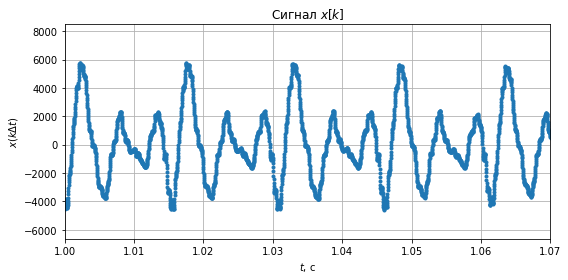

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=[8, 4]) # размер полотна
plt.plot(np.arange(x.size)/fs, x, '.') # график сигнала (точками)
plt.grid() # сетка 
plt.xlim([1, 1.07]) # Выделение фраграмента от 1 с до 1,07 с
plt.title("Cигнал $x[k]$") # заголовок графика
plt.xlabel("$t$, c") # подпись оси абсцисс
plt.ylabel("$x(k\Delta t)$") # подпись оси ординат
plt.tight_layout()
plt.show()

Оценим спектр исходного сигнала с помощью ДВПФ для выборок сигнала $\Delta t x(k\Delta t)$ (`x/fs`). Связь между спектрами аналогового сигнала и цифрового в данном случае:
$$X_д (f) =  \sum_{m=-\infty}^{\infty} X_а(f+m f_д )$$

* Если пренебречь эффектом наложения спектров, то на интервале $[-f_д/2; \; f_д/2]$ выполняется $X_а (f) \approx X_д(f) $. 

* Тогда можно построить оценку спектра $$\hat{X}_а (f) = X_д(f)\;\; при \;\; f\in[-f_д/2; \; f_д/2].$$ Вычислим ее в `Nfft` точках, равномерно расположенных на полуинтервале  $[-f_д/2; \; f_д/2)$.

* Поскольку правый конец полуинтервала (точка $f_д/2$) не включается, при задании частот нужно указать `endpoint=False`. 

* ДВПФ в этих точках вычислим с помощью ДПФ (`scipy.fft.fft` или `np.fft.fft`). 

* Чтобы перенести отсчеты ДПФ c полуинтервала $[0, f_д)$ на полуинтервал $[-f_д/2; \; f_д/2)$  используем функцию `scipy.fft.fftshift` или `np.fft.fftshift`.

* Определим размерность ДПФ `Nfft` как наибольшее из двух: $2^{19}$ и результата работы функции `scipy.fft.next_fast_len` для длины последовательности. Функция `scipy.fft.next_fast_len` определить следующую размерность ДПФ, для которой вычисления по алгоритму быстрого преобразования Фурье проходят эффективно. 

In [ ]:
import scipy.fft
Nfft=max(scipy.fft.next_fast_len(x.size), 2**19) 
f, Xf = np.linspace(-0.5*fs, 0.5*fs, num=Nfft, endpoint=False), scipy.fft.fftshift(scipy.fft.fft(x/fs, Nfft))

In [ ]:
print("Размерность ДПФ", Nfft) 

Размерность ДПФ 524288


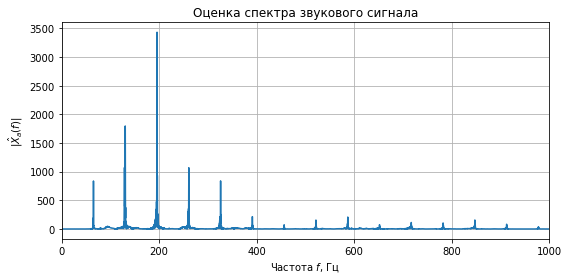

In [ ]:
plt.figure(figsize=[8, 4])
plt.title("Оценка спектра звукового сигнала")
plt.plot(f, abs(Xf), '-')
plt.xlim([0, 1000])
plt.grid()
plt.xlabel("Частота $f$, Гц")
plt.ylabel("$|\hat{X}_a(f)|$")
plt.tight_layout()
plt.show()

Пример анализа графика: во временной области мы можем наблюдать повторение через  

In [ ]:
print("%.3f c" % (1.00214-0.98680))

0.015 c


Такому периоду соотвествует частота 

In [ ]:
print("%.3f Гц" % (1/(1.00214-0.98680)))

65.189 Гц


Примерно на этой частоте мы наблюдаем первую гармонику в спектре сигнала. 

## Распознование сигнала с помощью ДПФ

Определим ДПФ сигнала из $N=64$ точек 
$$x[k] = \sin \left(2\pi  \dfrac{12}{N} k\right) + 2 \sin \left(2\pi  \dfrac{18}{N} k +\dfrac{\pi}{3}\right)$$

In [ ]:
N=64
k=np.arange(N)
x=np.sin(2*np.pi*k*12/N)+2*np.sin(2*np.pi*k*18/N+np.pi/3)

В теоретической части работы рассматривался пример задачи спектрального анализа по обнаружению и оцениванию параметров сигнала. Пусть обрабатываемая последовательность имеет вид
$$x[k]=\sum\limits_{m=1}^{M}{{{A}_{m}}}\sin (2\pi \frac{m}{N}k+{{\varphi }_{m}}),\quad k=0,\ 1,\ 2,\ \ldots ,\ N-1,$$
где ${{A}_{m}}$ и ${{\varphi }_{m}}$ – неизвестные заранее амплитуды и фазы гармонических составляющих; $m$– неизвестные заранее целые числа, определяющие нормированные частоты ${{\nu }_{m}}=m/N$ гармонических составляющих, которые совпадают с бинами ДПФ. Для определения ${{A}_{m}}$ и ${{\varphi }_{m}}$ в этом случае достаточно вычислить ДПФ последовательности: 
	$$\tilde{X}[n]=\frac{1}{N}\sum\limits_{k=0}^{N-1}{x[k]}{{e}^{-j\frac{2\pi }{N}nk}}.$$
Неизвестные амплитуды и фазы определяются как
${{A}_{m}}=2\left| \tilde{X}[m] \right|;\quad {{\varphi }_{m}}=\arg \tilde{X}[m]+\pi /2,\ \ m\in \left[ 0,\ \frac{N}{2}-1 \right]$


Для расчетов удобно сразу взять формулу ДПФ с нормировкой на число отсчетов:

In [ ]:
Xn=np.fft.fft(x)/N

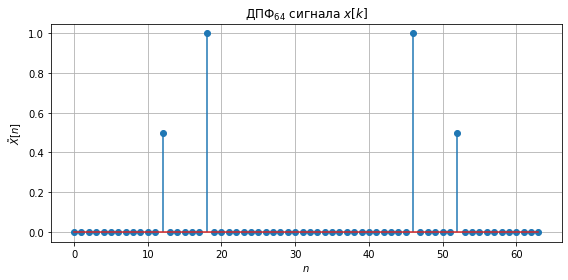

In [ ]:
plt.figure(figsize=[8, 4])
plt.title("ДПФ$_{%i}$ сигнала $x[k]$" %N)
plt.stem(np.arange(Xn.size), abs(Xn))
plt.ylabel("$\\tilde{X}[n]$")
plt.xlabel("$n$")
plt.tight_layout()
plt.grid()
plt.show()

На левой половине периода ненулевыми являются отсчеты ДПФ $n=12$ и $n=18$.

$$x[k]=A_{12} \sin \left(2\pi \dfrac{12}{64}k+{{\varphi }_{12}} \right) + A_{18} \sin \left(2\pi \dfrac{18}{64}k+{{\varphi }_{18}} \right),\quad k=0,\ 1,\ 2,\ \ldots ,\ 63.$$

Остается опредлить неизвестные амплитуды и фазы $A_{12}$, $A_{18}$, ${\varphi }_{12}$, ${\varphi }_{18}$. 

$A_{12}$

In [ ]:
2*abs(Xn[12])

1.0000000000000007

$A_{18}$

In [ ]:
2*abs(Xn[18])

1.999999999999999

${\varphi }_{12}$

In [ ]:
phi_12 = np.angle(Xn[12])+(np.pi/2)
phi_12

-1.5543122344752192e-15

${\varphi }_{18}$

In [ ]:
phi_18 = np.angle(Xn[18])+(np.pi/2)
phi_18

1.0471975511965972

${\varphi }_{18}$ сооставляет $1/3$ от $\pi$.

In [ ]:
phi_18/np.pi

0.33333333333333315

Оценка сигнала

$$x[k] = \sin \left(2\pi  \dfrac{12}{N} k\right) + 2 \sin \left(2\pi  \dfrac{18}{N} k +\dfrac{\pi}{3}\right)$$

## Оконные функции

`scipy.signal.get_window(window, Nx, fftbins=True)` Возвращает отсчеты оконной функции заданного типа и длины. 

**Parameters:**

`window` *string, float, or tuple* Тип оконной функции. 
* ***string***  Если окно непараметрическое (например, `boxcar`, `blackman`, `hamming`, `hann`, `bartlett`, `flattop`), то `window` — название окна (строка).

Название окна | Прямоугольное| Блэкмана|Хемминга| Ханна| Бартлета | С плоской вершиной
:----:  | :----:  | :----:    | :----:  | :----:| :----:    |  :----:   
***string*** | `boxcar`| `blackman`|`hamming`| `hann`| `bartlett`| `flattop`


* ***tuple*** Если окно параметрическое, то окно задается кортежем, где нулевой элемент — название окна (строка), а последующие элементы - параметры окна. Например, `('chebwin', 13)` — окно Чебышёва с уровнем боковых лепестков 13 дБ относительно главного, `('kaiser', 5)` — окно Кайзера с параметром $\beta=5$. 
Название окна | Кайзера| Чебышёва |
:----:  | :----:  | :----:    |
 ***tuple*** | `(kaiser, beta)` | `(chebwin, attenuation)`|
* ***float***  Для случая окна Кайзера можно сразу указать значение $\beta$ в параметр `window`.  Запись `window = 5` эквивалентна `window = ('kaiser', 5)`






`Nx` *int* Длина окна. 

`fftbins` *bool, optional* Если параметр равен `True` (по умолчанию), то создается окно для ДПФ, если `False` — симметричное на интервале $[0, N_x-1]$ окно, используемое для синтеза КИХ-фильтров.


**Returns:**

`get_window` *ndarray* Одномерный массив отсчетов окна длины `Nx`.

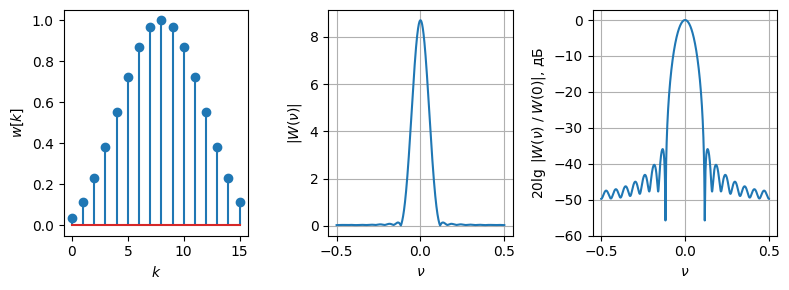

In [ ]:
plt.figure(figsize=[8, 3], dpi=100)
Nfft=2**18

N = 16
#w = signal.get_window('boxcar', N)
w = signal.get_window(('kaiser', 5), N)
# w = signal.get_window(5, N)
# w = signal.get_window(('chebwin', 13), N, fftbins=False)
k = np.arange(N)
nu, W = np.linspace(-0.5, 0.5, num=Nfft, endpoint=False), scipy.fft.fftshift(scipy.fft.fft(w, Nfft))

plt.subplot(1, 3, 1)
plt.stem(k, w)
plt.xlabel('$k$')
plt.ylabel('$w[k]$')


plt.subplot(1, 3, 2)
k=np.arange(N)
plt.plot(nu, abs(W))
plt.xlabel('$\\nu$')
plt.ylabel('$|W(\\nu)|$')
plt.grid()


plt.subplot(1, 3, 3)
k=np.arange(N)
with np.errstate(divide='ignore'): # Отключаем RuntimeWarning
    plt.plot(nu, 20*np.log10(abs(W)/max(abs(W))))
plt.ylim(ymin=-60)
plt.grid()
plt.xlabel('$\\nu$')
plt.ylabel('$20 \lg \; |W(\\nu)\; / \;W(0)|$, дБ')
plt.tight_layout()

## Взвешивание сигнала оконной функцией

### Пример 1. Различимость спектральных компонент.

Рассмотрим 64-точечный сигнал ($k=0,\;1,\;\dots, 63$)
$$x[k]=\sin\left( 2 \pi k \dfrac{11}{64}\right)+\sin\left( 2 \pi k \dfrac{13}{64}\right).$$
* Пример ниже показывает, что в случае прямоугольного окна (`w = signal.get_window('boxcar', N)`) спектральные компоненты вблизи частот $\nu_1={11}/{64}$ и  $\nu_2={13}/{64}$ различимы в ДВПФ. 
* Если выбрать окно Блэкмана(`w = signal.get_window('blackman', N)`) или окно Кайзера с параметром $\beta=8$ (`w = signal.get_window(('kaiser', 8), N)`), то эти спектральные компоненты неразличимы в ДВПФ.
* Если спектральные компоненты неразличимы в ДВПФ, то невозможно подобрать такую размерность ДПФ (`N_dft`), чтобы они оказались различимы в ДПФ. В противном случае это возможно. 

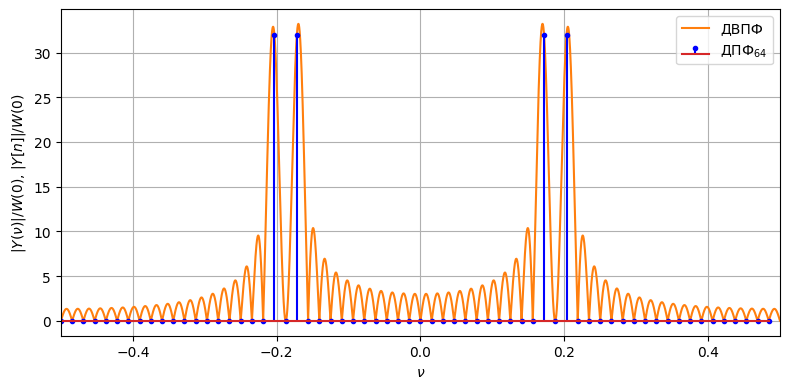

In [ ]:
N=64
N_dtft=2**14
N_dft=64
k=np.arange(N)
x=np.sin(2*np.pi*k*11/N)+np.sin(2*np.pi*k*13/N)

w = signal.get_window('boxcar', N)
# w = signal.get_window('blackman', N)
# w = signal.get_window(('kaiser', 8), N)
# w = signal.get_window('flattop', N)
y = x * w # Взвешивание сигнала оконной функцией
W0 = sum(w)

nu_dtft, X_dtft = np.linspace(-0.5, 0.5, num=N_dtft, endpoint=False), scipy.fft.fftshift(scipy.fft.fft(y, N_dtft))
nu_dft, X_dft = np.linspace(-0.5, 0.5, num=N_dft, endpoint=False), scipy.fft.fftshift(scipy.fft.fft(y, N_dft))


plt.figure(figsize=[8, 4], dpi=100)
plt.plot(nu_dtft, abs(X_dtft), 'C1', label='ДВПФ')
plt.stem(nu_dft, abs(X_dft), linefmt='b', markerfmt='.b', label='ДПФ$_{%i}$' % N_dft)
plt.xlabel('$\\nu$')
plt.ylabel('$|Y(\\nu)|/W(0)$, $|Y[n]|/W(0)$')
plt.xlim([-0.5, 0.5])
plt.legend()
plt.grid()
plt.tight_layout()

### Пример 2. Амплитудная модуляция спектра.
Рассмотрим 32-точечный сигнал ($k=0,\;1,\;\dots, 31$)
$$x[k]=\cos\left( 2 \pi k \dfrac{9.5}{32}\right)=\frac{1}{2}\exp\left({j2 \pi k \dfrac{9.5}{32}}\right)+\frac{1}{2}\exp\left({-j2 \pi k \dfrac{9.5}{32}}\right)$$
* Пусть $y[k]=x[k]w[k]$, где $w[k]$ — некоторое окно. ДВПФ сигнала $y[k]$ 
$$Y(\nu)=\dfrac{1}{2} W\left(\nu- \dfrac{9.5}{32} \right)+\dfrac{1}{2} W\left(\nu+ \dfrac{9.5}{32} \right).$$
Чтобы высоты максимумов на графике ДВПФ соответствовали амплитудам гармоник, нужно нормировать ось ординат на $W(0)$.
* Если выбрать прямоугольное окно, `w = signal.get_window('boxcar', N)`, то оценки амплитуд, получаемые с помощью ДПФ$_{32}$, ,будут отличаться от истинных значений на $-3,92$ дБ (значение коэффициента паразитной амплитудной модуляции). 
* Результат можно исправить, дополняя сигнал нулевыми отсчетами и увеличивая размерность ДПФ. 
* Без изменения размерности ДПФ лучшего результата можно добиться с помощью окна с плоской вершиной `w = signal.get_window('flattop', N)`.
* В реальности часто частоты гармоник неизвестны. Поэтому для оценки амплитуд используются окна с низким коэффициентом паразитной амплитудной модуляции (например, flattop-окно).

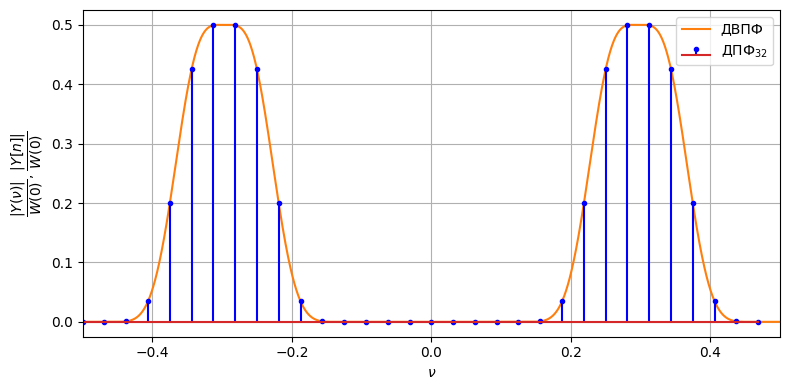

In [ ]:
N=64
N_dtft=2**14
N=32
N_dft=32
k=np.arange(N)
x=np.cos(2*np.pi*9.5/N*k)

# w = signal.get_window('boxcar', N)
# w = signal.get_window('blackman', N)
# w = signal.get_window(('kaiser', 8), N)
w = signal.get_window('flattop', N)
y = x * w
W0 = sum(w)


nu_dtft, X_dtft = np.linspace(-0.5, 0.5, num=N_dtft, endpoint=False), scipy.fft.fftshift(scipy.fft.fft(y, N_dtft))
nu_dft, X_dft = np.linspace(-0.5, 0.5, num=N_dft, endpoint=False), scipy.fft.fftshift(scipy.fft.fft(y, N_dft))


plt.figure(figsize=[8, 4], dpi=100)
plt.plot(nu_dtft, abs(X_dtft)/W0, 'C1', label='ДВПФ')
plt.stem(nu_dft, abs(X_dft)/W0, linefmt='b', markerfmt='.b', label='ДПФ$_{%i}$' % N_dft)
plt.xlabel('$\\nu$')
plt.ylabel('$\dfrac{|Y(\\nu)|}{W(0)}$, $\dfrac{|Y[n]|}{W(0)}$')
plt.xlim([-0.5, 0.5])
plt.legend()
plt.grid()
plt.tight_layout()

## Кратковременное дискретное преобразование Фурье (STFT)

Кратковременное дискретное преобразование Фурье (Discrete  STFT, англ. Discrete Short-time Fourier transform) можно задать формулой
$${{X}_{m}}[n]=\sum\limits_{k=mR}^{mR+M-1}{x}[k]w[k-mR]\exp \left( -j2\pi \frac{nk}{{{N}_{\text{FFT}}}} \right),$$
где 
* $w[k]$ — временное окно, 
* $m$ — порядковый номер сегмента, 
* $M$ — длина окна (сегмента), 
* ${{N}_{\text{FFT}}}$ – размерность ДПФ, 
* $R=M-L$ – единичный сдвиг окна, 
* $L$ — размер перекрытия. 

Это преобразование позволяет осуществлять ДПФ-анализ на коротких интервалах времени. Для графического отображения результатов данного преобразования часто используется представление в виде графика с двумя осями, где по горизонтальной оси отображается время (или номер кадра $m$), по вертикальной — соответствующие частоты, а цветом отображается $|{{X}_{m}}[n]|$, $|{{X}_{m}}[n]{{|}^{2}}$ (в случае спектрограммы), или фазовая часть ${{X}_{m}}[n]$.


### Функция scipy.signal.stft

`scipy.signal.stft(x, fs=1.0, window='hann', nperseg=256, noverlap=None, nfft=None, detrend=False, return_onesided=True, boundary='zeros', padded=True, axis=-1, scaling='spectrum')` Расчет кратковременного дискретного преобразования Фурье (STFT)

**Основные параметры:**

`x` *array_like* Отсчеты сигнала. 

`fs` *float, optional* Частота дискретизации. 

`window` *str or tuple or array_like, optional* Используемое окно. Задается в виде параметров для функции `get_window` (без указания длины) или в виде массива отсчетов окна. По умолчанию генерируется окно Ханна. 

`nperseg` *int, optional* Длина сегмента $M$ (длина окна). По умолчанию 256.

`noverlap` *int, optional* Число точек в перекрытии $L$. По умолчанию, используется 50% перекрытие. 

`nfft` *int, optional* Размерность ДПФ сегментов.

Описание параметров `detrend`, `return_onesided`, `boundary`, `padded` , `axis`, `scaling: {‘spectrum’, ‘psd’}` можно найти в API reference SciPy. 

**Returns:**
`f` *ndarray* Массив частот спектрограммы.

`t` *ndarray* Массив времен спектрограммы.

`Zxx` *ndarray* Значения STFT.

### Пример построения спектрограммы

In [ ]:
import numpy as np # импорт бибилиотеки numpy
import matplotlib.pyplot as plt # импорт модуля matplotlib.pyplot
from scipy import signal
import scipy.io.wavfile
from IPython.display import Audio

fs, x = scipy.io.wavfile.read('vibraphone-loop-1.wav')
if x.shape[1]>1:
    x=x[:, 0] # берем левый канал в случае, если wav-файл — стереозапись 
Audio('./vibraphone-loop-1.wav')

C:\Users\torma\AppData\Local\Temp/ipykernel_13204/3277627667.py:7: WavFileWarning: Chunk (non-data) not understood, skipping it.
  fs, x = scipy.io.wavfile.read('vibraphone-loop-1.wav')


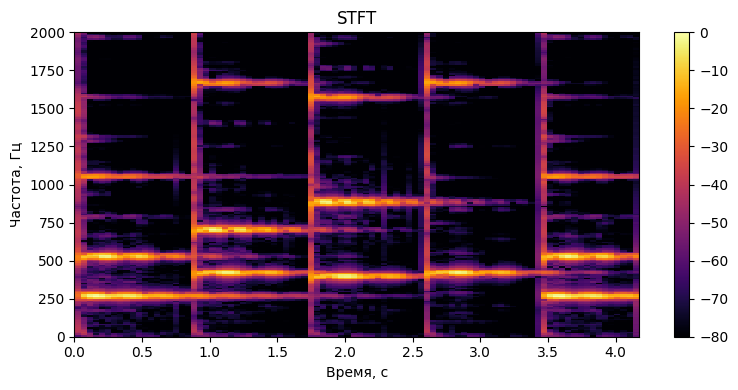

In [ ]:
plt.figure(figsize=[8, 4], dpi=100)
f, t, Zxx = signal.stft(x, fs=fs, window=('hann'), nperseg=4000, noverlap=2000, nfft=2**12)
plt.pcolormesh(t, f,  20*np.log10(np.abs(Zxx[:-1, :-1])/np.max(abs(Zxx))), vmin=-80, cmap=plt.get_cmap('inferno'), shading='flat')
plt.colorbar()
plt.ylim((0, 2000))
plt.title('STFT')
plt.ylabel('Частота, Гц')
plt.xlabel('Время, с')
plt.tight_layout()

Разрешение по времени для STFT равно длине единичного сдвига окна в секундах, т.е. $R/{{f}_{\text{s}}}$. 

Разрешение по частоте обусловлено двумя параметрами.

* Сеткой частот ДПФ $\Delta f={{f}_{\text{s}}}/{{N}_{\text{FFT}}}$, где ${{N}_{\text{FFT}}}$— размерность ДПФ. Это разрешение можно улучшить без изменения длины кадра — путем добавления нулевых отсчетов. 

* Шириной главного лепестка оконной функции. Как правило, этот параметр зависит от длины окна $M.$


###  Проверка условий COLA(R) и NOLA(R)

По опредлению, окно $w[k]$ обладает свойством COLA(R), если 
$\underset{m=-\infty }{\overset{\infty }{\sum }}\,w[k-mR]=const \ \forall k\in \mathbf{Z}$.

In [ ]:
from scipy import signal
signal.check_COLA(window=signal.get_window('hann', 4000), nperseg=4000, noverlap=2000)

True

По опредлению, окно $w[k]$ обладает свойством NOLA(R), если 
$\underset{m=-\infty }{\overset{\infty }{\sum }}\,w[k-mR]^2 \neq 0\ \forall k\in \mathbf{Z}$.

In [ ]:
signal.check_NOLA(window=signal.get_window('hann', 4000), nperseg=4000, noverlap=2000)

True

### Вычисление обратного преобразования

Вычисление обратного преобразования можно провести с помощью функции `scipy.signal.istft`.

In [ ]:
t1, x1 =  signal.istft(Zxx, fs=fs, window=('hann'), nperseg=4000, noverlap=2000, nfft=2**12)
x1

array([-9.09494702e-10,  4.54747126e-09, -3.63801471e-09, ...,
        6.82084419e-10,  1.25055381e-09,  4.54747631e-10])

### Пример. Формирование спектрограммы  ЛЧМ - сигнала

Рассмотрим сигнал, частота которого изменяется по линейному закону:

$$f(t) = f_0 + (f_1 - f_0) t / t_1$$

In [ ]:
fs=500
f0=1
f1=80
t=np.arange(0, 2, 1/fs)
x = signal.chirp(t, f0=f0, f1=f1, t1=2, method='linear')

Формирование спектрограммы  ЛЧМ - сигнала без перекрытия сегментов. 

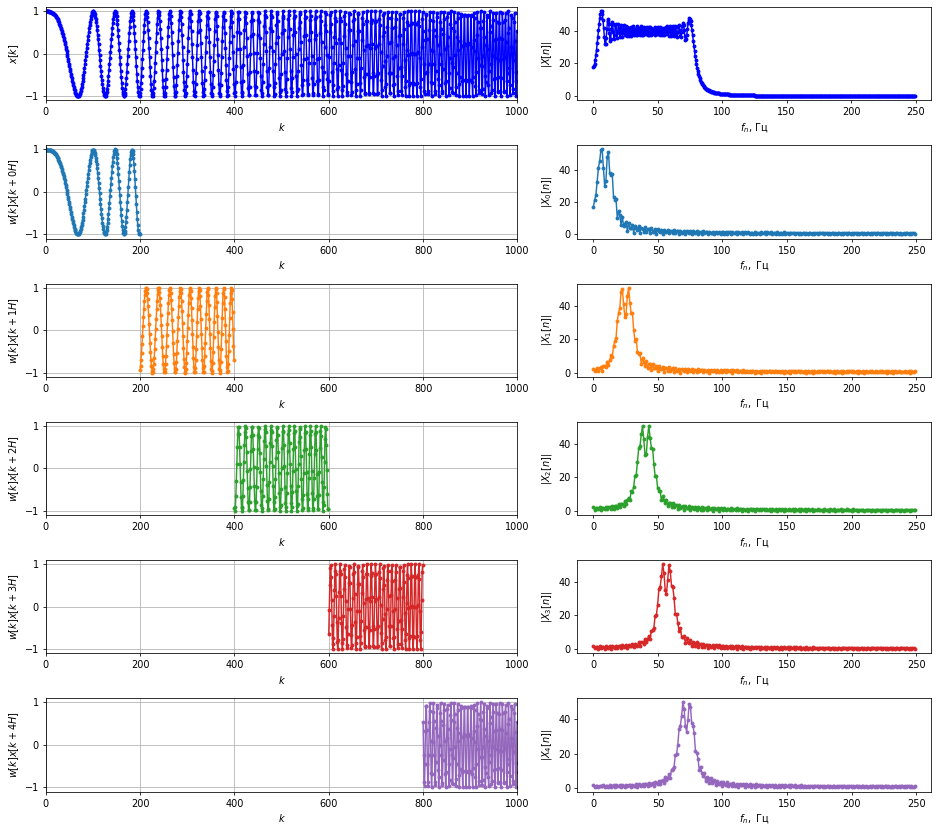

In [ ]:
plt.figure(figsize=[13.5, 12], dpi=70)
nseg=5
nperseg=200
noverlap=0
from matplotlib import gridspec
gs = gridspec.GridSpec(nseg+1, 2, width_ratios=[8, 6])

plt.subplot(gs[0])
plt.plot(np.arange(x.size), x, '.-b')
plt.xlim([0, x.size])
plt.tight_layout()
plt.grid()
plt.ylabel('$x[k]$')
plt.xlabel('$k$')

plt.subplot(gs[1])
X_n=np.fft.fft(x)
plt.plot(np.arange(X_n.size//2)*fs/X_n.size, abs(X_n[0:X_n.size//2]), '.-b')
plt.ylabel('$|X[n]|$')
plt.xlabel('$f_n$, Гц')

for u in range(nseg):
    plt.subplot(gs[u*2+2])
    y=x[(nperseg-noverlap)*u:(nperseg-noverlap)*u+nperseg]*signal.windows.boxcar(nperseg, sym=False)
    plt.plot(np.arange((nperseg-noverlap)*u, (nperseg-noverlap)*u+nperseg), y, '.-C%i' %u)
    plt.xlim([0, x.size])
    plt.ylabel('$w[k]x[k+%iH]$' %u)
    plt.xlabel('$k$')
    plt.grid()
    plt.yticks([-1, 0, 1])
    plt.tight_layout()
    
    plt.subplot(gs[u*2+3])
    X_n=np.fft.fft(y, 512)
    plt.plot(np.arange(X_n.size//2)*fs/X_n.size, abs(X_n[0:X_n.size//2]), '.-C%i'  %u)
    plt.ylabel('$|X_{%i}[n]|$' %u)
    plt.xlabel('$f_n,$ Гц')
    plt.tight_layout()

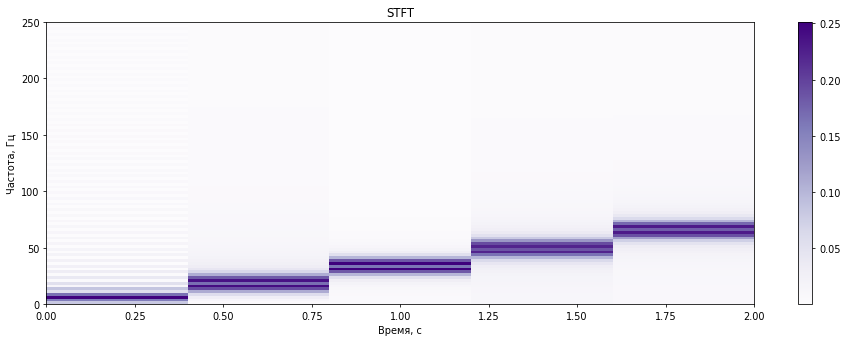

In [ ]:
f, t, Zxx = signal.stft(x, fs=fs, window=('boxcar'), nperseg=200, noverlap=0, nfft=200)
plt.figure(figsize=[13.5, 5], dpi=70)
plt.pcolormesh(t, f, np.abs(Zxx[:-1, :-1]), cmap=plt.get_cmap('Purples'), shading='flat')
plt.colorbar()
plt.title('STFT')
plt.ylabel('Частота, Гц')
plt.xlabel('Время, с')
plt.tight_layout()
plt.show()

Формирование спектрограммы  ЛЧМ - сигнала с перекрытием сегментов 50%. 

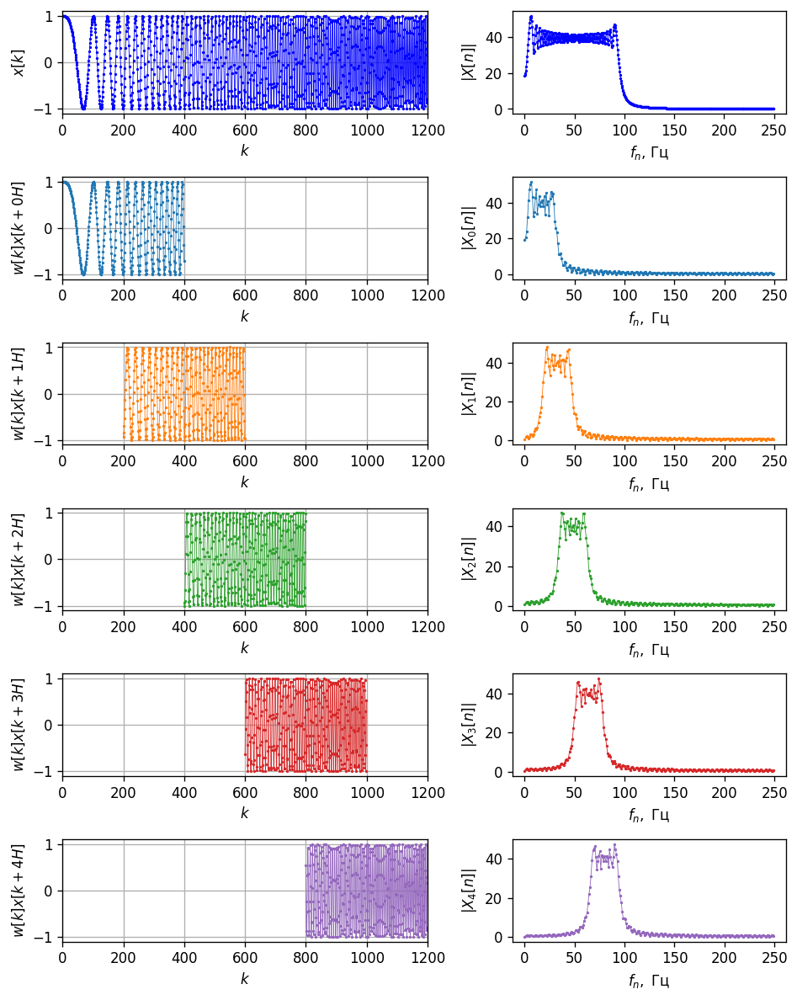

In [ ]:
plt.figure(figsize=[8, 10], dpi=120)
fs=500
f0=1
f1=80
t=np.arange(0, 2.4, 1/fs)
x = signal.chirp(t, f0=f0, f1=f1, t1=2, method='linear')

nseg=5
nperseg=400
noverlap=200
from matplotlib import gridspec
gs = gridspec.GridSpec(nseg+1, 2, width_ratios=[8, 6])
linewidth=0.5
ms=2
plt.subplot(gs[0])
plt.plot(np.arange(x.size), x, '.-b', linewidth=0.5, ms=ms)
plt.xlim([0, x.size])
plt.tight_layout()
plt.grid()
plt.ylabel('$x[k]$')
plt.xlabel('$k$')

plt.subplot(gs[1])
X_n=np.fft.fft(x)
plt.plot(np.arange(X_n.size//2)*fs/X_n.size, abs(X_n[0:X_n.size//2]), '.-b', linewidth=linewidth, ms=ms)
plt.ylabel('$|X[n]|$')
plt.xlabel('$f_n$, Гц')

for u in range(nseg):
    plt.subplot(gs[u*2+2])
    y=x[(nperseg-noverlap)*u:(nperseg-noverlap)*u+nperseg]*signal.windows.boxcar(nperseg, sym=False)
    plt.plot(np.arange((nperseg-noverlap)*u, (nperseg-noverlap)*u+nperseg), y, '.-C%i' %u, linewidth=linewidth, ms=ms)
    plt.xlim([0, x.size])
    plt.ylabel('$w[k]x[k+%iH]$' %u)
    plt.xlabel('$k$')
    plt.grid()
    plt.yticks([-1, 0, 1])
    plt.tight_layout()
    
    plt.subplot(gs[u*2+3])
    X_n=np.fft.fft(y, 512)
    plt.plot(np.arange(X_n.size//2)*fs/X_n.size, abs(X_n[0:X_n.size//2]), '.-C%i'  %u, linewidth=linewidth, ms=ms)
    plt.ylabel('$|X_{%i}[n]|$' %u)
    plt.xlabel('$f_n,$ Гц')
    plt.tight_layout()

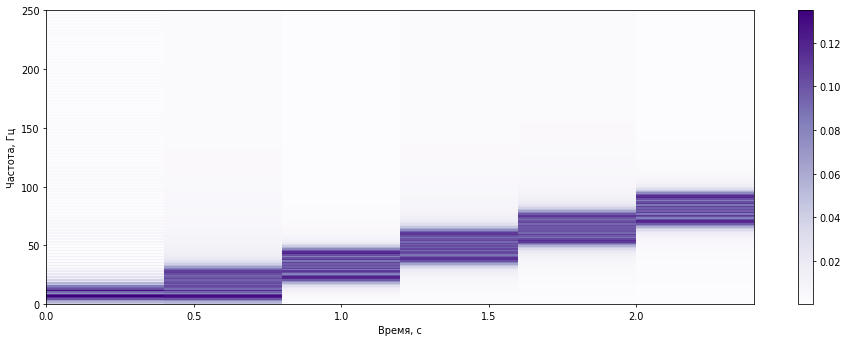

In [ ]:
f, t, Zxx = signal.stft(x, fs=fs, window=('boxcar'), nperseg=400, noverlap=200, nfft=400)
plt.figure(figsize=[13.5, 5], dpi=70)
plt.pcolormesh(t, f, np.abs(Zxx[:-1, :-1]), cmap=plt.get_cmap('Purples'), shading='flat')
plt.colorbar()
plt.ylabel('Частота, Гц')
plt.xlabel('Время, с')
plt.tight_layout()

### Пример. Влияние выбора окна. 

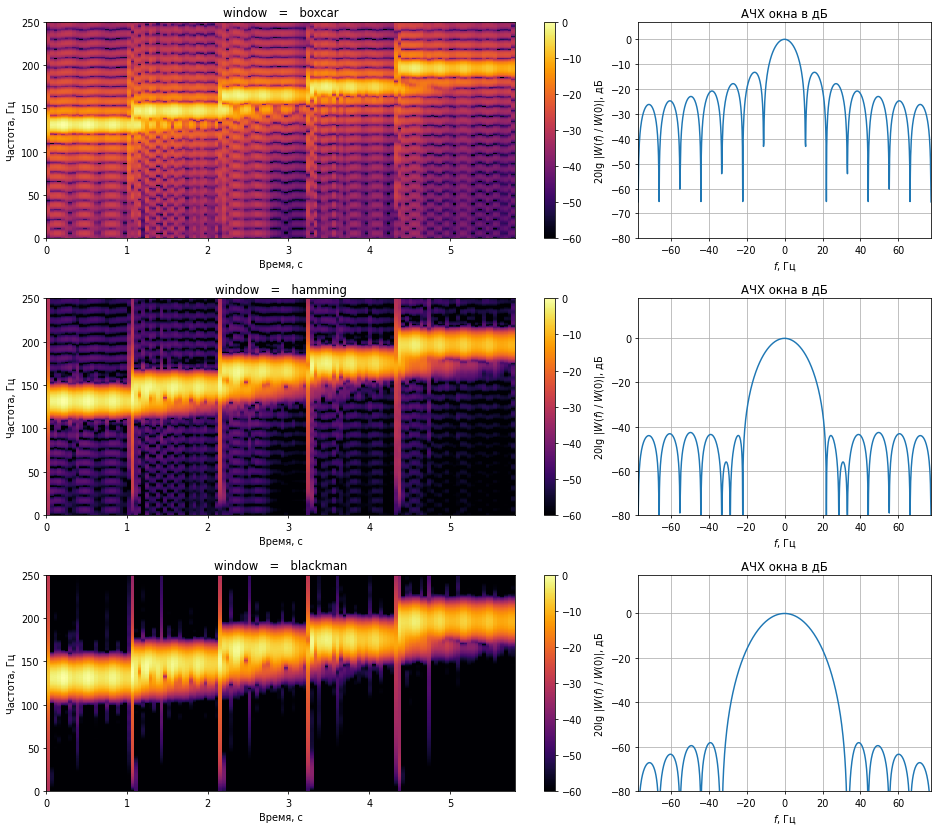

In [ ]:
import scipy.io.wavfile
fs, x = scipy.io.wavfile.read('vibraphone-scale.wav')
x=x[:, 0]
N_dtft=2**18

windows=['boxcar', 'hamming', 'blackman']
gs = gridspec.GridSpec(len(windows), 2, width_ratios=[8, 4])
u=0
plt.figure(figsize=[13.5, 12], dpi=70)
for window in windows: #'bartlett', 'hann', 
    plt.subplot(gs[u*2], title='window   =   %s' % (window))
    nperseg=4000
    noverlap=nperseg//2
    f, t, Zxx = signal.stft(x, fs=fs, window=window, nperseg=nperseg, noverlap=noverlap, nfft=2**16)
    plt.pcolormesh(t, f,  20*np.log10(np.abs(Zxx[:-1, :-1])/np.max(abs(Zxx))), vmin=-60, cmap=plt.get_cmap('inferno'), shading='flat')
    plt.colorbar()
    plt.ylim((0, 250))
    plt.ylabel('Частота, Гц')
    plt.xlabel('Время, с')
    plt.tight_layout()
    plt.subplot(gs[u*2+1], title='АЧХ окна в дБ')
    w=signal.windows.get_window(window, Nx=nperseg)
    f, W = np.linspace(-fs/2, fs/2, num=N_dtft, endpoint=False), scipy.fft.fftshift(scipy.fft.fft(w, N_dtft))
    with np.errstate(divide='ignore'): # Отключаем RuntimeWarning
        plt.plot(f, 20*np.log10(abs(W)/max(abs(W))))
    plt.ylim(ymin=-80)
    plt.xlim([-7*fs/nperseg, 7*fs/nperseg])
    plt.grid()
    plt.xlabel('$f$, Гц')
    plt.ylabel('$20 \lg \; |W(f)\; / \;W(0)|$, дБ')
    plt.tight_layout()
    u+=1   

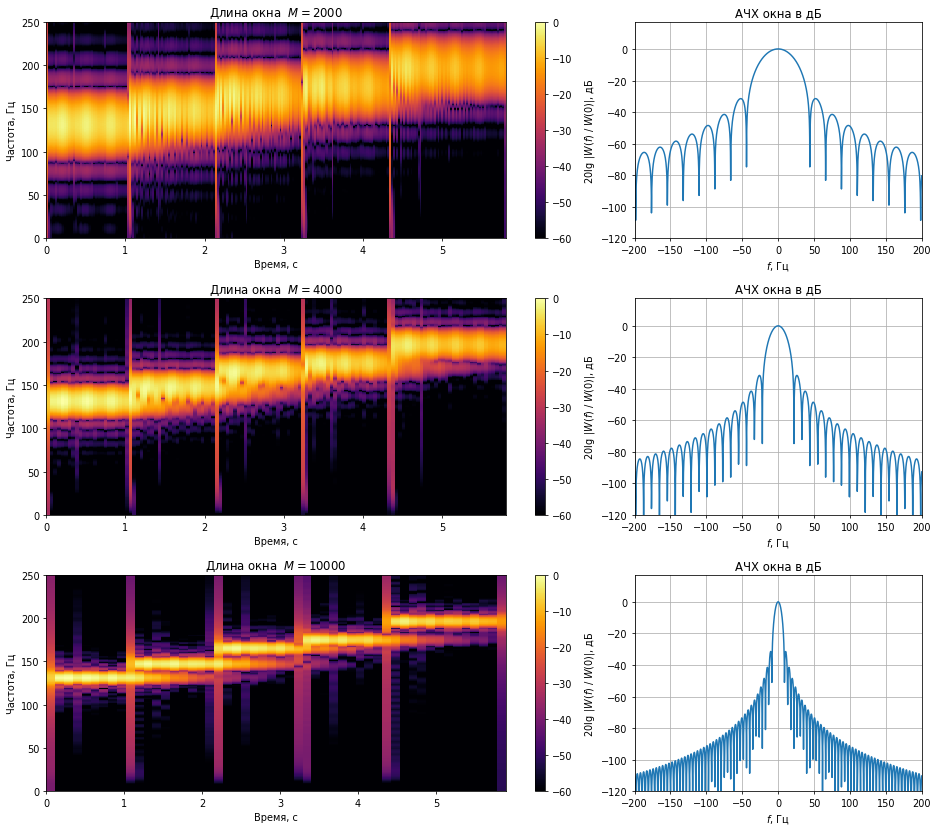

In [ ]:
import scipy.io.wavfile
fs, x = scipy.io.wavfile.read('vibraphone-scale.wav')
x=x[:, 0]
N_dtft=2**18

window='hann'

gs = gridspec.GridSpec(len(windows), 2, width_ratios=[8, 4])
u=0
plt.figure(figsize=[13.5, 12], dpi=70)
for nperseg in [2000, 4000, 10000]: 
    plt.subplot(gs[u*2], title='Длина окна  $M=%s$' % (nperseg))
    noverlap=nperseg//2
    f, t, Zxx = signal.stft(x, fs=fs, window=window, nperseg=nperseg, noverlap=noverlap, nfft=2**16)
    plt.pcolormesh(t, f,  20*np.log10(np.abs(Zxx[:-1, :-1])/np.max(abs(Zxx))), vmin=-60, cmap=plt.get_cmap('inferno'), shading='flat')
    plt.colorbar()
    plt.ylim((0, 250))
    plt.ylabel('Частота, Гц')
    plt.xlabel('Время, с')
    plt.tight_layout()
    plt.subplot(gs[u*2+1], title='АЧХ окна в дБ')
    w=signal.windows.get_window(window, Nx=nperseg)
    f, W = np.linspace(-fs/2, fs/2, num=N_dtft, endpoint=False), scipy.fft.fftshift(scipy.fft.fft(w, N_dtft))
    with np.errstate(divide='ignore'): # Отключаем RuntimeWarning
        plt.plot(f, 20*np.log10(abs(W)/max(abs(W))))
    plt.ylim(ymin=-120)
    plt.xlim([-200, 200])
    plt.grid()
    plt.xlabel('$f$, Гц')
    plt.ylabel('$20 \lg \; |W(f)\; / \;W(0)|$, дБ')
    plt.tight_layout()
    u+=1   